In [144]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import seaborn as sns
import math
from ucimlrepo import fetch_ucirepo
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn import preprocessing
from sklearn.svm import SVR
from sklearn import svm

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings("ignore")

sns.set_theme(style="darkgrid")

from scipy.stats import skew
from scipy.stats import zscore

## Data Description

ก่อนจะหาความหมายของ Dataset, Features และ Classes เราต้องแปลงไฟล์ให้กลายเป็นรูปแบบที่ pandas สามารถอ่านได้โดยการรวมแกน X(Samples) แกน y (Features) ด้วยกันและลบแถวที่ซ้ำทิ้ง

### MEANING ID TABLE

| ID | Meaning |
|:--------:|:--------:|
|  age   |  อายุผู้ป่วย   |
|  death   |  การเสียชีวิตเมื่อใดก็ได้จนถึง National Death Index (NDI) เมื่อวันที่ 31 ธันวาคม พ.ศ. 2537 ผู้ป่วยบางรายได้รับการปล่อยตัวก่อนและไม่ได้ติดตามผล   |
|  sex  |  เพศ   |
|dzgroup|หมวดหมู่ย่อยอาการป่วยของผู้ป่วย ARF/MOSF w/Sepsis, CHF, COPD, Cirrhosis, Colon Cancer, Coma, Lung Cancer, MOSF w/Malig|
|dzclass|หมวดหมู่ย่อยอาการป่วยของผู้ป่วย "ARF/MOSF", "COPD/CHF/Cirrhosis", "Cancer", "Coma".|
|num.co|จำนวนโรคที่เกิดขึ้นพร้อมกัน (หรือโรคร่วม) ที่ผู้ป่วยแสดง โดยค่าที่สูงกว่าบ่งบอกถึงสภาวะcที่แย่ลงและโอกาสรอดชีวิตที่ต่ำลง|
|edu|ระยะเวลาที่เรียน (year)|
|income|รายได้($/year)|
|scoma|SUPPORT day 3 Coma Score ตาม Glasgow scale(ผลลัพธ์จากการ predict)|
|charges|ค่าใช้จ่ายพยาบาลทั้งหมด($)|
|totcst|อัตราส่วนโดยรวมของค่าใช้จ่ายจิปาถะต่อค่ารักษาพยาบาล|
|totmcst|ค่าใช้จ่ายจิปาถะโดยรวม($) avtisst : คะแนน TISS เฉลี่ย วันที่ 3-25 โดย Therapeutic Intervention Scoring System (TISS) เป็นวิธีการคำนวณค่าใช้จ่ายในห้องผู้ป่วยหนัก (ICU) และหน่วยดูแลผู้ป่วยระยะกลาง (IMCU)|
|race|ชนชาติ|
|sps |SUPPORT คะแนนสรีรวิทยาในวันที่ 3|
|aps|APACHE III คะแนนสรีรวิทยาในวันที่ 3 (no coma, imp bun,uout for ph1)|
|surv2m|SUPPORT model การคาดการณ์การรอดชีวิตในเวลา 2 เดือนในวันที่ 3 (เก็บผลจากโมเดล)|
|surv6m|SUPPORT model การคาดการณ์การรอดชีวิตในเวลา 6 เดือนในวันที่ 3 (เก็บผลจากโมเดล)|
|hday|จำนวนที่ผู้ป่วยพักในโรงพยาบาล|
|diabetes|ผู้ป่วยมีอาการเป็นเบาหวานเป็นโรคร่วมหรือไม่ (Com 27-28, Dx 73) (Y) or not (N)|
|dementia|ผู้ป่วยมีอาการสมองเสื่อมเป็นโรคร่วมหรือไม่ (Comorbidity 6) (Y) or not (N)|
|ca|ผู้ป่วยมีโรคมะเร็ง (Y),เชื้อมะเร็งแพร่กระจาย(metastatic) หรือสุขภาพดี(N)|
|prg2m|การคาดการณ์การรอดชีวิตในระยะ 2 เดือนของผู้ป่วยจากแพทย์ prg6m : การคาดการณ์การรอดชีวิตในระยะ 6 เดือนของผู้ป่วยจากแพทย์|
|dnr|ผู้ป่วยจะมีคำสั่งห้ามช่วยชีวิต (DNR) หรือไม่ มี classes คือ dnr after sadm, dnr before sadm, missing, no dnr. dnrday : วันที่สั่ง DNR(<0 ถ้าสั่งก่อนการวิจัยนี้)|
|meanbp |ค่าเฉลี่ยความดันโลหิตของผู้ป่วย วัดในวันที่ 3|
|wblc |จำนวนเม็ดเลือดขาว (หลักพัน) วัดในวันที่ 3|
|hrt|อัตราการเต้นหัวใจผู้ป่วยวัดวันที่ 3|
|resp|อัตราการหายใจผู้ป่วยวัดวันที่ 3|
|temp |อุณหภูมิผู้ป่วย(ํCelcius)วัดวันที่ 3|
|pafi|อัตราส่วน  PaO2/FiO2  วัดในวันที่ 3 อัตราส่วนความดัน oxygen ที่บอกความสามารถการถ่ายเทจากปอดไปเลือด (PaO2 ในหน่วย mmHg) ต่อความเข้มข้น oxygenที่อยู่ในอากาศหายใจ (FiO2 แสดงเป็นเศษส่วน)|
|alb| ระดับ serum albumin วัดวันที่ 3|
|bili|ระดับ bilirubin วัดวันที่ 3|
|crea|ระดับ serum creatinine วัดวันที่ 3|
|sod|ความเข้มข้น serum sodium วัดวันที่ 3|
|ph|ค่า ph เลือดในหลอดเลือดใหญ่ ปกติค่า ph ควรอยู่ 7.35-7.45 ค่าผิดปกติอาจมาจาก ปอด,ไต,อาการป่วยจากการเผาพลาญผิดปกติ,ยา,อาการบาดเจ็บที่หัว,คอ หรืออื่นๆ ที่มีผลต่อการหายใจ|
|glucose|ระดับ gluclose วัดวันที่ 3. bun : ระดับ Blood urea Nitrogen วัดวันที่ 3|
|urine|ระดับ urine output วัดวันที่ 3|
|adlp|Index of Activities of Daily Living (ADL) , กรอกโดยผู้ป่วย. ค่ายิ่งมากโอกาสรอดชีวิตยิ่งสูง, วัดวันที่ 3|
|adls|Index of Activities of Daily Living (ADL) , กรอกโดยตัวแทนผู้ป่วย. ค่ายิ่งมากโอกาสรอดชีวิตยิ่งสูง, วัดวันที่ 3|
|adlsc |ADL ที่ถูกปรับเทียบกับค่าที่กรอกโดยตัวแทนผู้ป่วย|
|death |การตายเวลาใดๆ จนถึ National Death Index (NDI)(31/12/1994) แต่ผู้ป่วยบางคนอาจปล่อยก่อนและไม่ได้ติดตามผล hospdead : การตายในโรงพยาบาล sfdm2 : ระดับความยากในการทำกิจกรรมชองผู้ป่วยพิการในระดับ 1-5(5 คือร้ายแรงสุด). ค่าได้จากการถามผู้ป่วยหรือตัวแทนผู้ป่วยเพื่อหา Sickness Profile Impact (SIP)|

## PART DATA LOADING

ทำการโหลดชุดข้อมูลที่สนใจจาก `ucimlrepo` โดยชุดข้อมูลที่สนใจมีความเกี่ยวข้องกับทางการเเพทย์โดยมีโหลดเข้าคือ `fetch_ucirepo`

เเละเพื่อเเปลงไฟล์ให้เป็นในรูปเเบบ Pandas Frame ต้องมีการรวม X (sample) เเละ y (Features) เเล้วจึงนำไปลบเเถวที่ซ้ำกันออกด้วย tool `drop_duplicates()`

In [145]:
# fetch dataset
support2 = fetch_ucirepo(id=880)

# Loading the fetch_ucirepo
X = support2.data.features
y = support2.data.targets
X,y

(           age     sex            dzgroup             dzclass  num.co   edu  \
 0     62.84998    male        Lung Cancer              Cancer       0  11.0   
 1     60.33899  female          Cirrhosis  COPD/CHF/Cirrhosis       2  12.0   
 2     52.74698  female          Cirrhosis  COPD/CHF/Cirrhosis       2  12.0   
 3     42.38498  female        Lung Cancer              Cancer       2  11.0   
 4     79.88495  female  ARF/MOSF w/Sepsis            ARF/MOSF       1   NaN   
 ...        ...     ...                ...                 ...     ...   ...   
 9100  66.07300    male  ARF/MOSF w/Sepsis            ARF/MOSF       1   8.0   
 9101  55.15399  female               Coma                Coma       1  11.0   
 9102  70.38196    male  ARF/MOSF w/Sepsis            ARF/MOSF       1   NaN   
 9103  47.01999    male       MOSF w/Malig            ARF/MOSF       1  13.0   
 9104  81.53894  female  ARF/MOSF w/Sepsis            ARF/MOSF       1   8.0   
 
           income  scoma  charges     

In [146]:
df=pd.concat([pd.DataFrame(X), pd.DataFrame(y)], axis=1)
print('Before deleting duplicate values:', df.shape)


df=df.drop_duplicates()
# Removing duplicate rows if any
print('After deleting duplicate values:', df.shape)

# df.head(df.shape[0])

Before deleting duplicate values: (9105, 45)
After deleting duplicate values: (9105, 45)


### Defining the problem statement 

เป้าหมายเพื่อทำการดูเเนวโน้มองค์ประกอบทที่มีผลต่ออัตราการเต้นของหัวใจ ข้อมูลชุดไหนที่ส่งผลต่อการเต้นมากน้อย

- **Predictor** : age, dzgroup, dzclass, num.co, sps, aps, meanbp, wblc, resp, temp, ph, glucose, sod

- **Sample** : รายชื่อผู้ป่วยโรคร้ายเเรง

- **Model used** : Regression Model


## PART Data Exploration

ขั้นตอนนี้มีจุดประสงค์เพื่อสำรวจชุดข้อมูลที่่นำศึกษาประกอบไปด้วยองค์ประกอบใดบ้าง

เเละ สิ่งที่ต้องการในการสำรวจชุดข้อมูล มีดังนี้

- Dtype ของเเต่ละข้อมูล
- mean
- std
- ค่าประกอบ (min, 25%,	50%, 75%, max)
- ค่า unique ของทุกชุดข้อมูล

ในทุกขั้นตอนประกอบไปด้วย Tool ดังนี้ `df.info()`, `df.describe()`, `df.nunique()`


In [147]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9105 entries, 0 to 9104
Data columns (total 45 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       9105 non-null   float64
 1   sex       9105 non-null   object 
 2   dzgroup   9105 non-null   object 
 3   dzclass   9105 non-null   object 
 4   num.co    9105 non-null   int64  
 5   edu       7471 non-null   float64
 6   income    6123 non-null   object 
 7   scoma     9104 non-null   float64
 8   charges   8933 non-null   float64
 9   totcst    8217 non-null   float64
 10  totmcst   5630 non-null   float64
 11  avtisst   9023 non-null   float64
 12  race      9063 non-null   object 
 13  sps       9104 non-null   float64
 14  aps       9104 non-null   float64
 15  surv2m    9104 non-null   float64
 16  surv6m    9104 non-null   float64
 17  hday      9105 non-null   int64  
 18  diabetes  9105 non-null   int64  
 19  dementia  9105 non-null   int64  
 20  ca        9105 non-null   obje

In [148]:
df.describe(include='all').T #Nan แปลว่าประเภท Data ไม่เหมาะต่อการคำนวณ (มี Nan อยู่ใน Data)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,9105.0,NaN,NaN,NaN,62.650823,15.59371,18.04199,52.797,64.85699,73.99896,101.84796
sex,9105,2,male,5125,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dzgroup,9105,8,ARF/MOSF w/Sepsis,3515,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dzclass,9105,4,ARF/MOSF,4227,NaN,NaN,NaN,NaN,NaN,NaN,NaN
num.co,9105.0,NaN,NaN,NaN,1.868644,1.344409,0.0,1.0,2.0,3.0,9.0
edu,7471.0,NaN,NaN,NaN,11.747691,3.447743,0.0,10.0,12.0,14.0,31.0
income,6123,4,under $11k,2855,NaN,NaN,NaN,NaN,NaN,NaN,NaN
scoma,9104.0,NaN,NaN,NaN,12.058546,24.636694,0.0,0.0,0.0,9.0,100.0
charges,8933.0,NaN,NaN,NaN,59995.787811,102648.778198,1169.0,9740.0,25024.0,64598.0,1435423.0
totcst,8217.0,NaN,NaN,NaN,30825.867768,45780.820986,0.0,5929.5664,14452.7344,36087.9375,633212.0


In [149]:
df.nunique()

age         7323
sex            2
dzgroup        8
dzclass        4
num.co        10
edu           31
income         4
scoma         11
charges     8501
totcst      8197
totmcst     5516
avtisst      352
race           5
sps          604
aps          125
surv2m       949
surv6m       936
hday          85
diabetes       2
dementia       2
ca             3
prg2m         51
prg6m         87
dnr            3
dnrday       177
meanbp       164
wblc         499
hrt          186
resp          66
temp          98
pafi        1457
alb           60
bili         295
crea         130
sod           60
ph            77
glucose      439
bun          159
urine       1494
adlp           8
adls           8
adlsc       1735
death          2
hospdead       2
sfdm2          5
dtype: int64

### Exploration Result

### Selected Features

#### Integer Features
| ID | type | Number of Classes|
|:--------:|:--------:|:--------:|
|  hday   |  Integer-Numeric   | 85 |
|  glucose  |   Integer-Numeric| 439 |
|  bun    |  Integer-Numeric   | 159 |
|  urine   |  Integer-Numeric   | 1494 |

#### Binary Features
| ID | type | Number of Classes|
|:--------:|:--------:|:--------:|
|hospdead|Binary-Numeric|2|

#### Continuous Features
| ID | type | Number of Classes|
|:--------:|:--------:|:--------:|
|age|Continuous-Numeric|7323|
|num.co|Continuous-Numeric|10|
|scoma|Continuous-Numeric|11|
|charges|Continuous-Numeric|8501|
|totcst|Continuous-Numeric|8197|
|totmcst|Continuous-Numeric|5516|
|avtisst|Continuous-Numeric|352|
|sps|Continuous-Numeric|604|
|aps|Continuous-Numeric|125|
|surv2m|Continuous-Numeric|949|
|surv6m|Continuous-Numeric|936|
|prg2m|Continuous-Numeric|51|
|dnrday|Continuous-Numeric|177|
|meanbp|Continuous-Numeric|164|
|wblc|Continuous-Numeric|499|
|hrt|Continuous-Numeric|186|
|resp|Continuous-Numeric|66|
|temp|Continuous-Numeric|98|
|pafi|Continuous-Numeric|1457|
|alb|Continuous-Numeric|60|
|bili|Continuous-Numeric|295|
|crea|Continuous-Numeric|130|
|sod|Continuous-Numeric|60|
|ph |Continuous-Numeric|77|
|adls|Continuous-Numeric|8|
|adlsc|Continuous-Numeric|1735 |
|death|Continuous-Numeric|2|

#### Categorical Features
| ID | type | Number of Classes|
|:--------:|:--------:|:--------:|
|sex|Categorical-Norminal|2|
|dzgroup|Categorical-Norminal|8|
|dzclass|Categorical-Norminal|4|
|edu|Categorical-Norminal|31|
|income|Categorical-Norminal|4|
|race|Categorical-Norminal|5|
|diabetes|Categorical-Norminal|2|
|dementia|Categorical-Norminal|2|
|ca|Categorical-Norminal|3|
|prg6m|Categorical-Norminal|87|
|dnr|Categorical-Norminal|3|
|adlp|Categorical-Norminal|8|
|sfdm2|Categorical-Norminal|5|

## PART Check Distribution of Target Features

In [150]:
df['aps'].describe()

count    9104.000000
mean       37.597979
std        19.903852
min         0.000000
25%        23.000000
50%        34.000000
75%        49.000000
max       143.000000
Name: aps, dtype: float64

<Axes: >

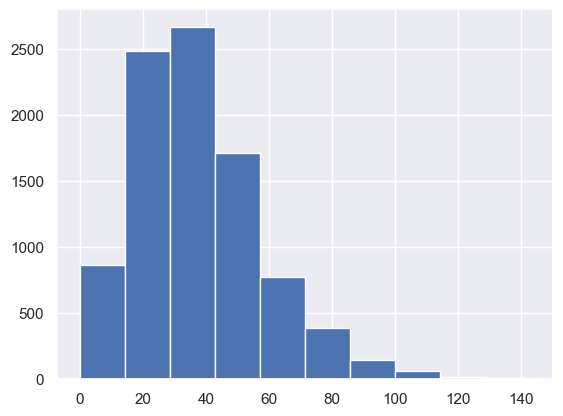

In [151]:
df['aps'].hist()

จากกราฟที่เเสดงขั้นต้นสังเกตได้ว่าในชุดข้อมูล `Target : hrt` มีค่า Outlier ปรากฎณ์อยู่เล็กน้อยที่ช่วงข้อมูล 250-300


ข้อมูลเป็นประเภท Right-Skewed Data

## PART Visual Exploratory Data Analysis for data distribution

จุดประสงค์เพื่อดูการกระจายตัวของค่าข้อมูล โดยมีการทำ 2 ขั้นตอน ดังนี้

- Histogram & Barcharts
- Selection based on data distribution

**Integer Features** : `hday`, `glucose`, `bun`, `urine` โดยชุดข้อมูลนับเป็น Continuous Data เนื่องจากเเปรผันตรงกับ Target

**Binary Features** : `hospdead` นับเป็น Categorical Data

> <span style="color:red"> **NOTE** : hday พล็อตคู่กับ `Target : hrt` เพื่อดูการเป็น Continuoue หรือ Categorical</span>


### USING HISTOGRAM & BARCHARTS

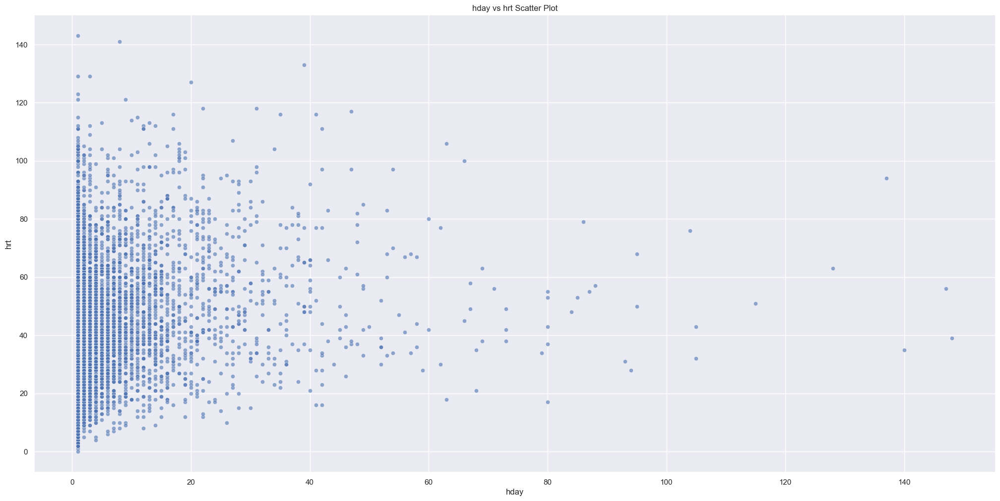

In [152]:
plt.figure(figsize=(25, 12))
plt.scatter(df['hday'], df['aps'],
            alpha=0.6, edgecolors='w', linewidth=0.5)
plt.title(f'hday vs hrt Scatter Plot')
plt.xlabel('hday')
plt.ylabel('hrt')
plt.show()

จากขั้นตอนข้างต้นสรุปได้ว่า

**Categorical Data** มีเพียง `hday` ซึ่งมีจำนวน Classes มากกว่า 20 Classes

**Categorical Numeric Data** เป็น `adlp`เเละนำไปพล็อตเพื่อดูความสัมพันธ์ต่อการตัดสินใจในการเลือกตัดออกหรือเปลี่ยนให้เป็น Continuous Value

In [153]:
from sklearn.linear_model import LinearRegression

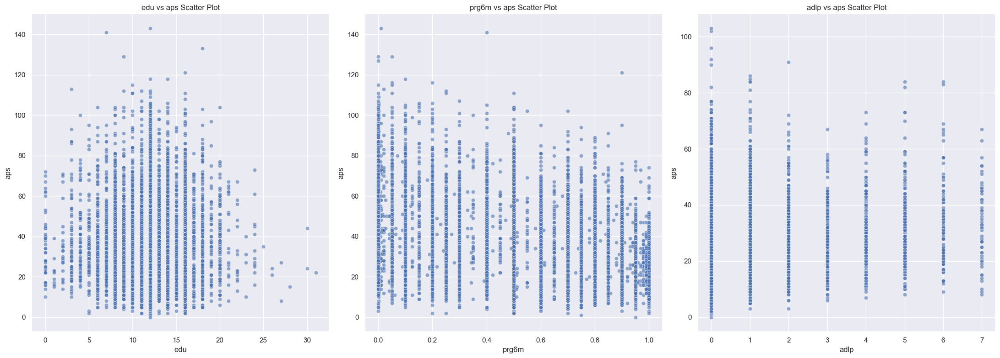

In [154]:
fig, axes = plt.subplots(1, 3, figsize=(22, 8))  # 1 row, 3 columns

for i, feature in enumerate(['edu', 'prg6m', 'adlp']):
    axes[i].scatter(df[feature], df['aps'], alpha=0.6, edgecolors='w', linewidth=0.5)
    axes[i].set_title(f'{feature} vs aps Scatter Plot')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('aps')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

### Selection based on data distribution

จากการพล็อตเพื่อดูความสัมพันธ์ข้างต้น สามารถกำหนดให้ `edu`, `prg6m`, `adlp` เป็น **Continuous Data** เเละ

  `dementia`, `diabetes` เป็น **Continuous Data** เนื่องจากกเพื่อความเหมาะสมต่อการคำนวณ `Model : ประเภท Regression `

#### Check Distribution of Numerical Data

> ขั้นตอนการเเยกประเภทข้อมูลระหว่าง Continuous Data  เเละ Categorical Data ออกจากกัน ด้วย Tool คำสั่งดังนี้

`DataFrame.select_dtypes(include=None, exclude=None)`

In [155]:
all_cols=df.columns
plt.figure(figsize=(20,30))

<Figure size 2000x3000 with 0 Axes>

<Figure size 2000x3000 with 0 Axes>

##### เเยกข้อให้เป็นประเภท **Categorical Data**

In [156]:
cate_cols=df.select_dtypes(include=[ 'object','category']).columns
cate_cols

Index(['sex', 'dzgroup', 'dzclass', 'income', 'race', 'ca', 'dnr', 'sfdm2'], dtype='object')

##### เเยกข้อให้เป็นประเภท **Continuous Data**

In [157]:
con_cols=df.select_dtypes(include=['int', 'float']).columns
con_cols

Index(['age', 'num.co', 'edu', 'scoma', 'charges', 'totcst', 'totmcst',
       'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'diabetes',
       'dementia', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp',
       'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun',
       'urine', 'adlp', 'adls', 'adlsc', 'death', 'hospdead'],
      dtype='object')

###### HISTOGRAM

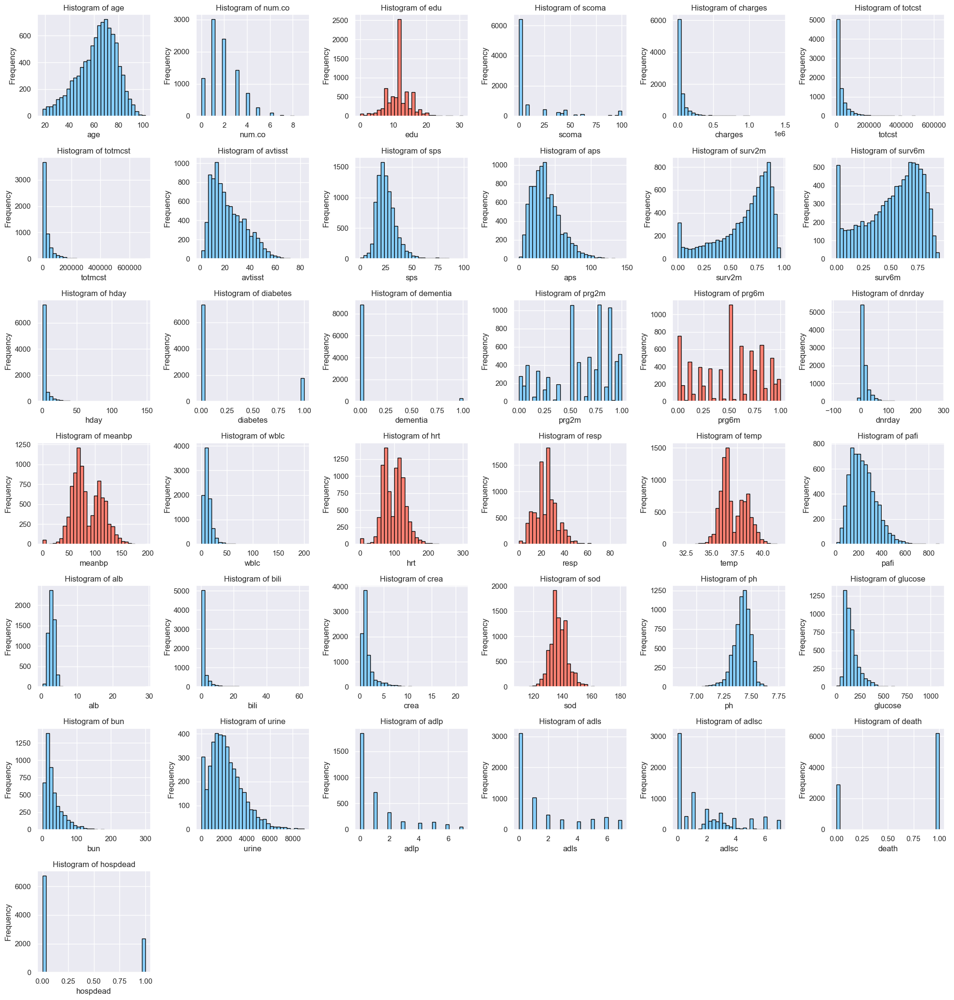

In [158]:
def is_skewed(data, threshold=0.5):
    """Checks if data is skewed based on skewness value."""
    skewness = skew(data, axis=0)
    return abs(skewness) > threshold

num_cols = len(con_cols)
num_rows = math.ceil(num_cols / 6)  # Calculate number of rows needed
num_cols_grid = min(num_cols, 6)  # Number of columns, capped at 6

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols_grid, figsize=(20, num_rows * 3))

# Flatten the axes array for easier iteration
axes = axes.flatten() if num_rows > 1 else axes  


for i, col in enumerate(con_cols):
  
    ax = axes[i] # Access subplot directly using flattened axes

    data = df[col].dropna()
    color = 'lightskyblue' if is_skewed(data) else 'salmon'
    ax.hist(data, bins=30, color=color, edgecolor='black')
    ax.set_title(f'Histogram of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Remove empty subplots
if num_cols < len(axes):
    for i in range(num_cols, len(axes)):
        fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

**Normal Distribution** <span style="color:lightskyblue">**(Blue)**</span> : `age`, `num.co`, `scoma`, `charges`,`totcst`, `totmcst`, `avtisst`, `sps`, `aps`, `surv2m`, `surv6m`, `hday`, `diabetes`, `dementia`, `prg2m`, `dnrday`, `wblc`, `pafi`, `alb`, `bili`, `crea`, `ph`, `glucose`, `bun`, `urine`, `adlp`, `adls`, `adlsc`, `death`, `hospdead`


**Skewd Distribution** <span style="color:salmon">**(Red)**</span> : `edu`, `prg6m`, `meanbp`, `hrt`, `resp`, `temp`, `sod`

###### BOXPLOT

<Axes: >

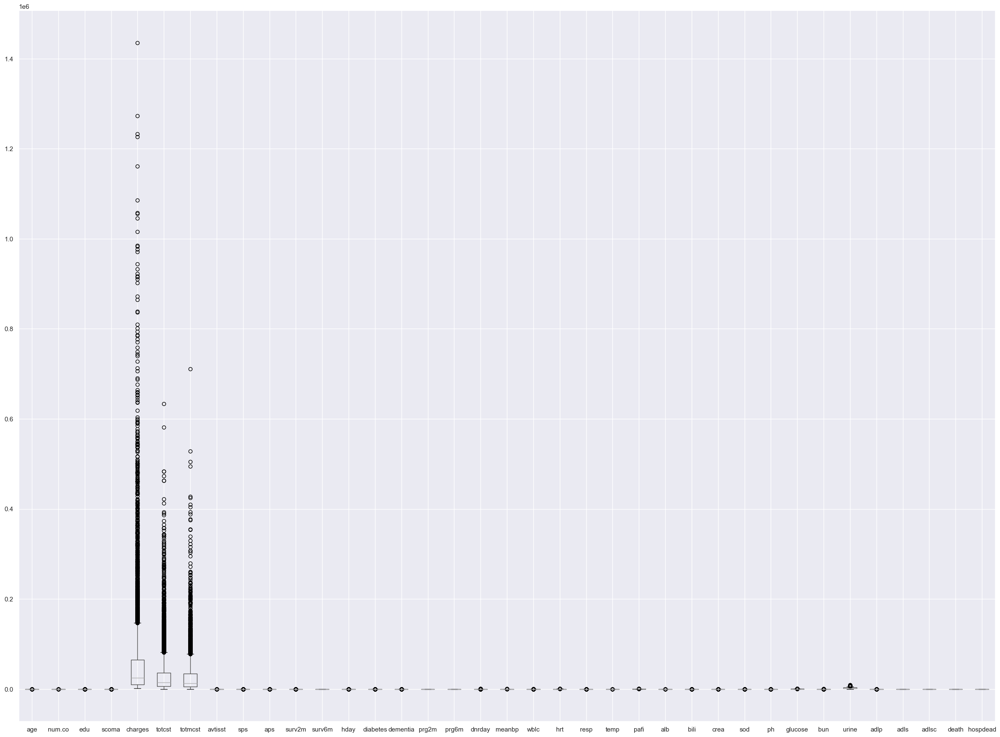

In [159]:
df.boxplot(column=list(con_cols), figsize=(30,22))

#### Check Distribution of Categorical Data

โดยจุดประสงค์ของส่วนนี้ คือ การดูค่าความ Frequency ของเเต่ละชุดข้อมูลที่เลือก เเละ เพื่อดูความสมดุลข้อมูล

 โดยชุดข้อมูลที่เลือกมา `sex`, `dzgroup`, `dzclass`, `income`, `race`, `ca`, `dnr`, `sfdm2` 

 เเละดูข้อมูลที่มี Missing Values ของชุดข้อมูล ทั้งในรูปเเบบจำนวน เเละ เปอร์เซ็น

In [160]:
# ตรวจสอบความสมดุลของข้อมูลในแต่ละคอลัมน์โดยคำนวณเปอร์เซ็นต์
sex_balance = df['sex'].value_counts(normalize=True) * 100
dzgroup_balance = df['dzgroup'].value_counts(normalize=True) * 100
dzclass_balance = df['dzclass'].value_counts(normalize=True) * 100
income_balance = df['income'].value_counts(normalize=True) * 100
race_balance = df['race'].value_counts(normalize=True) * 100
ca_balance = df['ca'].value_counts(normalize=True) * 100
dnr_balance = df['dnr'].value_counts(normalize=True) * 100
sfdm2_balance = df['sfdm2'].value_counts(normalize=True) * 100

# แสดงผลความสมดุลของข้อมูลในแต่ละคอลัมน์
print("Balance for sex:")
print(sex_balance)

print("\nBalance for dzgroup:")
print(dzgroup_balance)

print("\nBalance for dzclass:")
print(dzclass_balance)

print("\nBalance for income:")
print(income_balance)

print("\nBalance for race:")
print(race_balance)

print("\nBalance for ca:")
print(ca_balance)

print("\nBalance for dnr:")
print(dnr_balance)

print("\nBalance for sfdm2:")
print(sfdm2_balance)

Balance for sex:
sex
male      56.287754
female    43.712246
Name: proportion, dtype: float64

Balance for dzgroup:
dzgroup
ARF/MOSF w/Sepsis    38.605162
CHF                  15.233388
COPD                 10.620538
Lung Cancer           9.972543
MOSF w/Malig          7.819879
Coma                  6.545854
Colon Cancer          5.623284
Cirrhosis             5.579352
Name: proportion, dtype: float64

Balance for dzclass:
dzclass
ARF/MOSF              46.425041
COPD/CHF/Cirrhosis    31.433278
Cancer                15.595826
Coma                   6.545854
Name: proportion, dtype: float64

Balance for income:
income
under $11k    46.627470
$11-$25k      24.938756
$25-$50k      17.262780
>$50k         11.170995
Name: proportion, dtype: float64

Balance for race:
race
white       79.344588
black       15.348119
hispanic     3.199823
other        1.235794
asian        0.871676
Name: proportion, dtype: float64

Balance for ca:
ca
no            65.842943
metastatic    20.406370
yes         

## Missing Value Treatment and Standardization

In [161]:
df['dementia'].value_counts()

dementia
0    8809
1     296
Name: count, dtype: int64

ขั้นตอนการตรวจสอบ Missing Value:

In [162]:
missing_values = df.isnull().sum()
missing_df = pd.DataFrame(missing_values, columns=['Missing Count'])
missing_df['Percentage'] = (missing_df['Missing Count'] / len(df)) * 100
print(missing_df)

          Missing Count  Percentage
age                   0    0.000000
sex                   0    0.000000
dzgroup               0    0.000000
dzclass               0    0.000000
num.co                0    0.000000
edu                1634   17.946183
income             2982   32.751236
scoma                 1    0.010983
charges             172    1.889072
totcst              888    9.752883
totmcst            3475   38.165843
avtisst              82    0.900604
race                 42    0.461285
sps                   1    0.010983
aps                   1    0.010983
surv2m                1    0.010983
surv6m                1    0.010983
hday                  0    0.000000
diabetes              0    0.000000
dementia              0    0.000000
ca                    0    0.000000
prg2m              1649   18.110928
prg6m              1633   17.935200
dnr                  30    0.329489
dnrday               30    0.329489
meanbp                1    0.010983
wblc                212    2

- **การเลือกวิธีจัดการ Missing Value:**

Deletion: ลบแถวหรือคอลัมน์ที่มี Missing Value เหมาะสมเมื่อมี Missing Value น้อย และการลบข้อมูลไม่กระทบต่อผลลัพธ์มากนัก

- ```data.dropna()``` (ลบแถวที่มี Missing Value)
- ```data.dropna(axis=1)``` (ลบคอลัมน์ที่มี Missing Value)


>  Imputation: แทนที่ Missing Value ด้วยค่าที่เหมาะสม เหมาะสมเมื่อมี Missing Value มาก และการลบข้อมูลอาจทำให้สูญเสียข้อมูลสำคัญ

```Mean```/```Median```/```Mode``` Imputation: แทนที่ Missing Value ด้วยค่าเฉลี่ย, มัธยฐาน, หรือฐานนิยมของคอลัมน์นั้นๆ เหมาะสมกับข้อมูล ```Numerical``` ที่มีการกระจายตัวแบบปกติ

In [163]:
def missvaluefix(df):

  for label in df:

    if df[label].isnull().sum() >= 0.3*len(df[label]) :
      df.drop(label,axis = 1,inplace = True)
    else:

      if label in cate_cols:
        df[label]=df[label].fillna(df[label].mode()[0])

      elif label in con_cols:
        df[label]=df[label].fillna(df[label].mean())
  # for rows in df.index:
  #   if df.iloc[rows].isnull().sum() >= 0.3*len(df.iloc[rows]):
  #     df=df.drop(rows)
  return df

In [164]:
df_miss_fix=missvaluefix(df)
df_miss_fix.isnull().sum()

age         0
sex         0
dzgroup     0
dzclass     0
num.co      0
edu         0
scoma       0
charges     0
totcst      0
avtisst     0
race        0
sps         0
aps         0
surv2m      0
surv6m      0
hday        0
diabetes    0
dementia    0
ca          0
prg2m       0
prg6m       0
dnr         0
dnrday      0
meanbp      0
wblc        0
hrt         0
resp        0
temp        0
pafi        0
bili        0
crea        0
sod         0
ph          0
adlsc       0
death       0
hospdead    0
sfdm2       0
dtype: int64

## PART Outlier treatment

ในพาร์ทนี้จุดประสงค์เพื่อทำการตัดข้อมูลที่มีความคาดเคลื่อนสูง

In [165]:
from scipy.stats import zscore
variables_to_treat = ['age', 'num.co', 'edu', 'scoma', 'charges', 'totcst', 'totmcst',
       'avtisst', 'sps', 'aps', 'surv2m', 'surv6m', 'hday', 'diabetes',
       'dementia', 'prg2m', 'prg6m', 'dnrday', 'meanbp', 'wblc', 'hrt', 'resp',
       'temp', 'pafi', 'alb', 'bili', 'crea', 'sod', 'ph', 'glucose', 'bun',
       'urine', 'adlp', 'adls', 'adlsc', 'death', 'hospdead']


**Normal Data** <span style="color:lightskyblue">**(Blue)**</span> : ข้อมูลที่ไม่เป็น Outlier

**Outlier Data** <span style="color:salmon">**(Blue)**</span> : ข้อมูลที่เป็น Outlier

In [166]:
def outliersnumeric(col):

    q1,q3=np.percentile(col,[25,80])
    iqr=q3-q1
    lower_bound=q1-(1.5*iqr)
    upper_bound=q3+(1.5*iqr)

    return lower_bound,upper_bound

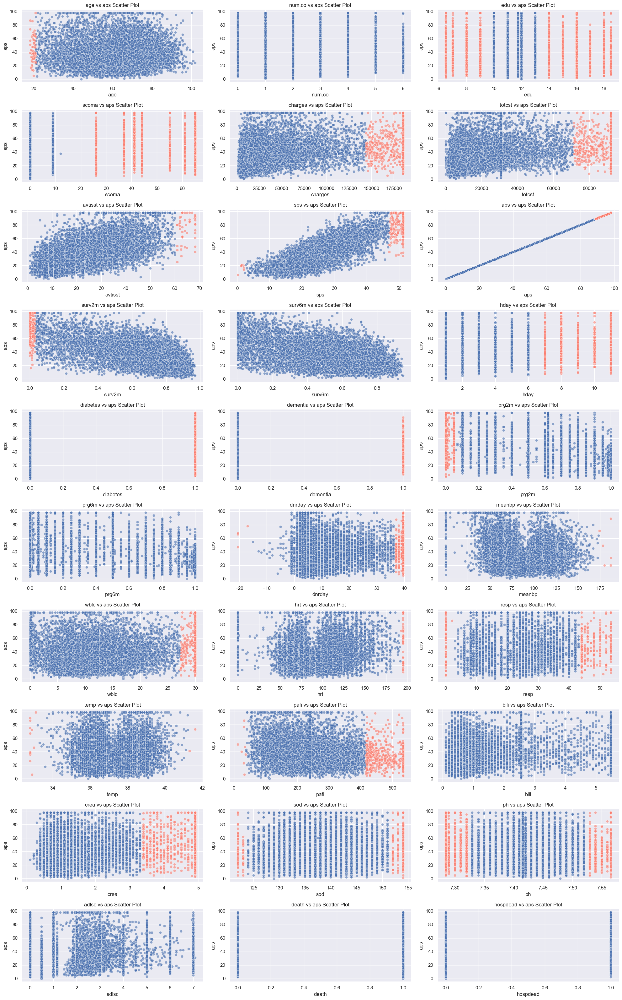

In [167]:
num_predictors = len(num_no_outlier)
num_cols = 3  # You can adjust this to fit your layout
num_rows = (num_predictors + num_cols - 1) // num_cols  # Calculate rows

# Create a single figure and axes for subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 32))  # Adjust figsize as needed

# Iterate through predictors and create scatter plots
for i, predictor in enumerate(num_no_outlier):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]  # Get the subplot axes for the current predictor
    
    # Calculate outliers using IQR
    Q1 = new_df[predictor].quantile(0.25)
    Q3 = new_df[predictor].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Identify outliers and regular data points
    outliers = new_df[(new_df[predictor] < lower_bound) | (new_df[predictor] > upper_bound)]
    regular_data = new_df[(new_df[predictor] >= lower_bound) & (new_df[predictor] <= upper_bound)]
    
    # Plot regular data points
    ax.scatter(regular_data[predictor], regular_data['aps'], alpha=0.6, edgecolors='w', linewidth=0.5)  
    
    # Plot outliers in salmon color
    ax.scatter(outliers[predictor], outliers['aps'], alpha=0.6, edgecolors='w', linewidth=0.5, color='salmon')
    
    ax.set_title(f'{predictor} vs aps Scatter Plot')
    ax.set_xlabel(predictor)
    ax.set_ylabel('aps')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

ชุดข้อมูลที่มี Outlier : `age`, `scoma`, `charges`,`totcst`, `totmcst`, `avtisst`, `sps`, `aps`, `surv2m`, `hday`, `diabetes`, `dementia`, `prg2m`, `dnrday`, `meanbp`, `wblc`, `hrt`, `resp`, `temp`, `pafi`, `crea`, `sod`, `ph`

In [168]:
new_df = df_miss_fix.copy()
outlier_summary = []  # List to store outlier information

for col in df_miss_fix:
    if pd.api.types.is_numeric_dtype(df_miss_fix[col]):
        if df_miss_fix[col].nunique() > 2:
            lower_bound, upper_bound = outliersnumeric(df_miss_fix[col])
            
            # Apply outlier capping
            new_df[col] = np.where(new_df[col] < lower_bound, lower_bound, new_df[col])
            new_df[col] = np.where(new_df[col] > upper_bound, upper_bound, new_df[col])
            
            # Store outlier information in the list
            outlier_summary.append({
                'Column': col,
                'Original Min': df_miss_fix[col].min(),
                'Original Max': df_miss_fix[col].max(),
                'Capped Min': new_df[col].min(),
                'Capped Max': new_df[col].max(),
                'Lower Bound': lower_bound,
                'Upper Bound': upper_bound
            })
            
        elif df_miss_fix[col].nunique() == 2:
                        # Resampling for binary columns
            class_1 = df_miss_fix[df_miss_fix[col] == 1]
            class_0 = df_miss_fix[df_miss_fix[col] == 0]
            
            majority_size = max(len(class_1), len(class_0))
            
            class_1_upsampled = class_1.sample(majority_size, replace=True, random_state=42)
            class_0_upsampled = class_0.sample(majority_size, replace=True, random_state=42)
            
            # Update new_df with resampled data for this binary column
            new_df = pd.concat([class_1_upsampled, class_0_upsampled])
            
            # Store resampling information in the list
            outlier_summary.append({
                'Column': col,
                'Original Class 0 Count': len(class_0),
                'Original Class 1 Count': len(class_1),
                'Resampled Class 0 Count': len(class_0_upsampled),
                'Resampled Class 1 Count': len(class_1_upsampled)
            })

# Create a DataFrame from the outlier summary list
outlier_summary_df = pd.DataFrame(outlier_summary)

# Display the DataFrame
display(outlier_summary_df)

,Column,Original Min,Original Max,Capped Min,Capped Max,Lower Bound,Upper Bound,Original Class 0 Count,Original Class 1 Count,Resampled Class 0 Count,Resampled Class 1 Count
0,age,18.041990,1.018480e+02,18.041990,101.847960,17.931075,110.906875,NaN,NaN,NaN,NaN
1,num.co,0.000000,9.000000e+00,0.000000,6.000000,-2.000000,6.000000,NaN,NaN,NaN,NaN
2,edu,0.000000,3.100000e+01,6.500000,18.500000,6.500000,18.500000,NaN,NaN,NaN,NaN
3,scoma,0.000000,1.000000e+02,0.000000,65.000000,-39.000000,65.000000,NaN,NaN,NaN,NaN
4,charges,1169.000000,1.435423e+06,1169.000000,185153.624000,-95186.574400,185153.624000,NaN,NaN,NaN,NaN
5,totcst,0.000000,6.332120e+05,0.000000,91965.521550,-44664.669250,91965.521550,NaN,NaN,NaN,NaN
6,avtisst,1.000000,8.300000e+01,1.000000,68.250000,-21.750000,68.250000,NaN,NaN,NaN,NaN
7,sps,0.199982,9.918750e+01,0.199982,51.246094,-0.347656,51.246094,NaN,NaN,NaN,NaN
8,aps,0.000000,1.430000e+02,0.000000,98.000000,-22.000000,98.000000,NaN,NaN,NaN,NaN
9,surv2m,0.000000,9.699707e-01,0.000916,0.969971,0.000916,1.352966,NaN,NaN,NaN,NaN


In [169]:
new_df=df_miss_fix.copy()
for col in df_miss_fix:
    # ตรวจสอบว่า Coumn เป็น numeric
    if pd.api.types.is_numeric_dtype(df_miss_fix[col]):
      if df_miss_fix[col].nunique()>2:
        # คำนวณขอบล่าง-บน IQR
        lower_bound, upper_bound = outliersnumeric(df_miss_fix[col])
        print(f"{col} - Lower bound: {lower_bound}, Upper bound: {upper_bound}")
        #ใส่ lower bound, upper bound ใน dataframe
        new_df[col] = np.where(new_df[col] < lower_bound, lower_bound, new_df[col])
        new_df[col] = np.where(new_df[col] > upper_bound, upper_bound, new_df[col])

        # เช็คการตัดค่าว่ามีผลไหม
        print(f"{col} - Min after capping: {new_df[col].min()}, Max after capping: {new_df[col].max()}")
        #Resampling ค่ากรณีที่มี classe 2 class
      elif df_miss_fix[col].nunique()==2:
        # แยก class ที่มีมากและน้อย
        class_1 = df_miss_fix[df_miss_fix[col] == 1]
        class_0 = df_miss_fix[df_miss_fix[col] == 0]

        # หาขนาด Class ที่มีค่าเยอะกว่า
        majority_size = max(len(class_1), len(class_0))

        # Oversample class เล็กกว่าให้มีขนาดเท่ากับ class ที่ใหญ่กว่า
        class_1_upsampled = class_1.sample(majority_size, replace=True, random_state=42)
        class_0_upsampled = class_0.sample(majority_size, replace=True, random_state=42)

        # รวมค่ากลับเข้าไปใน dataframe
        df_miss_fix = pd.concat([class_1_upsampled, class_0_upsampled])


        print("Resampled Data Distribution:\n", df[col].value_counts())

age - Lower bound: 17.931075, Upper bound: 110.90687499999999
age - Min after capping: 18.04199, Max after capping: 101.84796
num.co - Lower bound: -2.0, Upper bound: 6.0
num.co - Min after capping: 0.0, Max after capping: 6.0
edu - Lower bound: 6.5, Upper bound: 18.5
edu - Min after capping: 6.5, Max after capping: 18.5
scoma - Lower bound: -39.0, Upper bound: 65.0
scoma - Min after capping: 0.0, Max after capping: 65.0
charges - Lower bound: -95186.57440000016, Upper bound: 185153.62400000024
charges - Min after capping: 1169.0, Max after capping: 185153.62400000024
totcst - Lower bound: -44664.66925000002, Upper bound: 91965.52155000003
totcst - Min after capping: 0.0, Max after capping: 91965.52155000003
avtisst - Lower bound: -21.75, Upper bound: 68.25
avtisst - Min after capping: 1.0, Max after capping: 68.25
sps - Lower bound: -0.34765625, Upper bound: 51.24609375
sps - Min after capping: 0.1999817, Max after capping: 51.24609375
aps - Lower bound: -22.0, Upper bound: 98.0
aps -

In [170]:
df_miss_fix['dementia'].unique()

array([0, 1], dtype=int64)

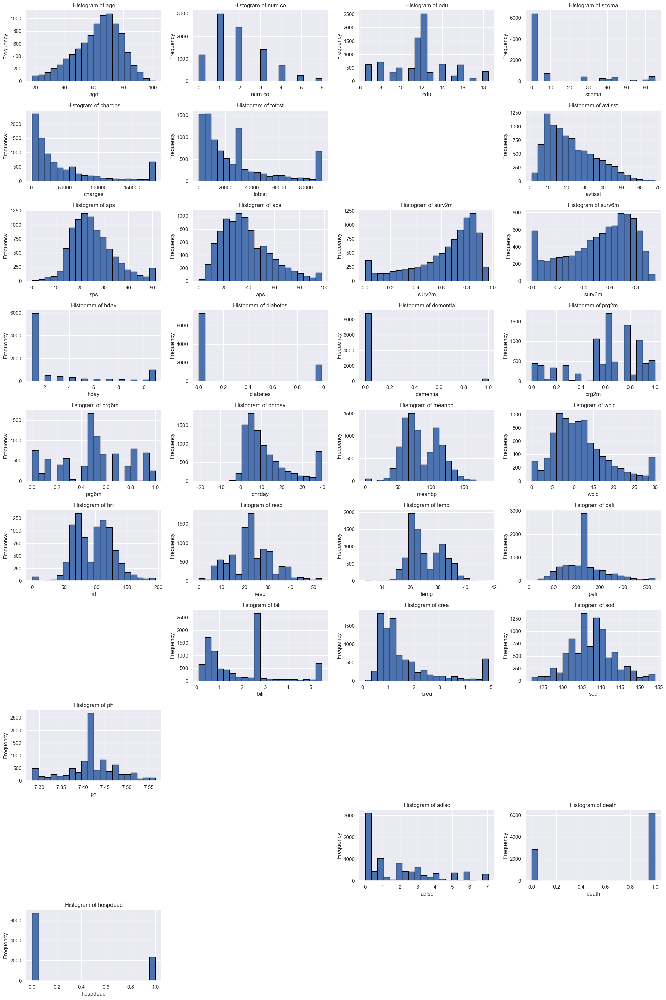

In [171]:
# Calculate the number of rows and columns for the subplot grid
num_vars = len(variables_to_treat)
num_cols = 4  
num_rows = (num_vars + num_cols - 1) // num_cols

plt.figure(figsize=(20, 30))

for i, var in enumerate(variables_to_treat):
    if var in new_df.columns:
        plt.subplot(num_rows, num_cols, i+1)  # Use calculated rows and columns
        plt.hist(new_df[var], bins=20, edgecolor='black')
        plt.title(f'Histogram of {var}')
        plt.xlabel(var)
        plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

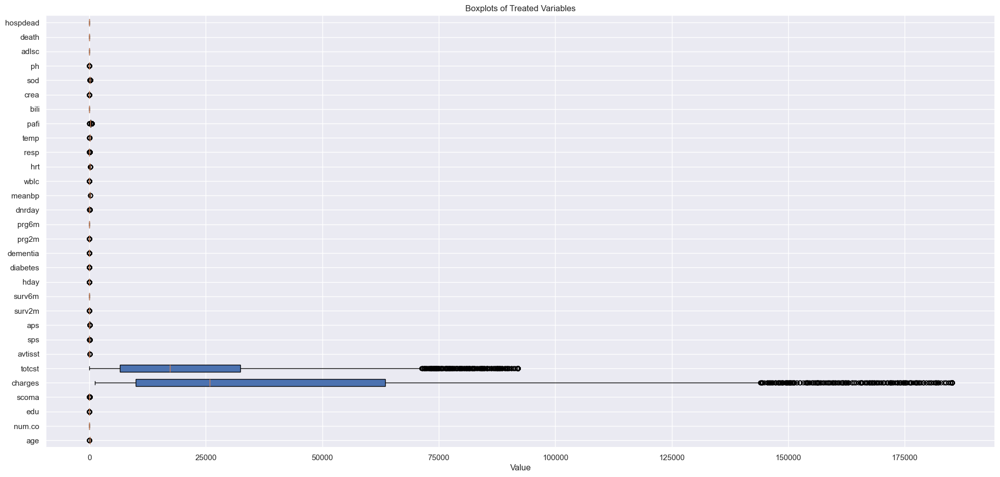

In [172]:
plt.figure(figsize=(24, 11))
plt.boxplot(
    [new_df[var].dropna().values for var in variables_to_treat if var in new_df.columns], 
    vert=False, 
    patch_artist=True
)

plt.yticks(range(1, len([var for var in variables_to_treat if var in new_df.columns]) + 1), 
           [var for var in variables_to_treat if var in new_df.columns]) 
plt.title('Boxplots of Treated Variables')
plt.xlabel('Value')
plt.show()

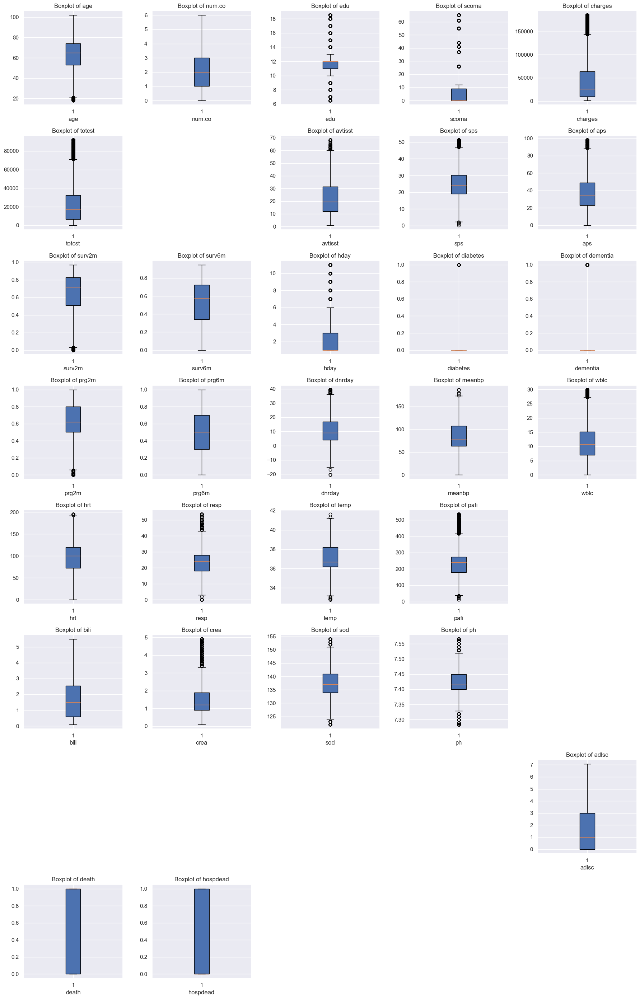

In [173]:
# Calculate the number of rows and columns for the subplot grid
num_vars = len(variables_to_treat)
num_cols = 5  # You can adjust this if needed
num_rows = (num_vars + num_cols - 1) // num_cols  # Calculate rows needed

plt.figure(figsize=(18, 28))

# Plot individual boxplots for each variable
for i, var in enumerate(variables_to_treat):
    if var in new_df.columns:
        plt.subplot(num_rows, num_cols, i + 1)  # Creating a grid with calculated rows and columns
        plt.boxplot(new_df[var].dropna().values, vert=True, patch_artist=True)
        plt.title(f'Boxplot of {var}')
        plt.xlabel(var)

plt.tight_layout()
plt.show()

Detecting Outliers Categorical

In [174]:
threshold = 5

# ฟังก์ชันเพื่อตัดข้อมูลที่มีสัดส่วนน้อยกว่า threshold
def drop_low_frequency_categories(df, column, threshold):

    # คำนวณสัดส่วนของแต่ละหมวดหมู่ในคอลัมน์
    value_counts = df[column].value_counts(normalize=True) * 100

    # กำหนดรายการของค่าที่ต้องการคงไว้ (มากกว่า threshold)
    categories_to_keep = value_counts[value_counts >= threshold].index

    # กรองข้อมูลเฉพาะหมวดหมู่ที่ต้องการคงไว้
    df = df[df[column].isin(categories_to_keep)]

    return df

# รายการคอลัมน์ที่ต้องการตัดข้อมูลตาม threshold
columns_to_treat = ['sex', 'dzgroup', 'dzclass', 'ca']

# Select desired columns
selected_df = df[['sex', 'dzgroup', 'dzclass', 'ca']]

# ใช้ฟังก์ชันกับทุกคอลัมน์ใน columns_to_treat
for col in columns_to_treat:
    selected_df = drop_low_frequency_categories(selected_df, col, threshold)  # Update selected_df

# แสดงผลลัพธ์หลังจากการตัด
display(selected_df)


,sex,dzgroup,dzclass,ca
0,male,Lung Cancer,Cancer,metastatic
1,female,Cirrhosis,COPD/CHF/Cirrhosis,no
2,female,Cirrhosis,COPD/CHF/Cirrhosis,no
3,female,Lung Cancer,Cancer,metastatic
4,female,ARF/MOSF w/Sepsis,ARF/MOSF,no
...,...,...,...,...
9100,male,ARF/MOSF w/Sepsis,ARF/MOSF,no
9101,female,Coma,Coma,no
9102,male,ARF/MOSF w/Sepsis,ARF/MOSF,no
9103,male,MOSF w/Malig,ARF/MOSF,yes


In [175]:

# ตั้งเกณฑ์สัดส่วนที่ต้องการตัด เช่น 5%
threshold = 10

# รายการคอลัมน์ที่ต้องการตัดข้อมูลตาม threshold
columns_to_treat = ['sex', 'dzgroup', 'dzclass', 'ca']

# Select desired columns
selected_df = df[['sex', 'dzgroup', 'dzclass', 'ca']]

# ฟังก์ชันเพื่อตรวจสอบความถี่ต่ำกว่าที่กำหนดและระบุเป็น outlier หรือไม่
def mark_low_frequency_categories(df, column, threshold):
    # คำนวณสัดส่วนของแต่ละหมวดหมู่ในคอลัมน์
    value_counts = df[column].value_counts(normalize=True) * 100

    # กำหนดรายการของค่าที่ต้องการคงไว้ (มากกว่า threshold)
    categories_to_keep = value_counts[value_counts >= threshold].index

    # สร้างคอลัมน์ใหม่เพื่อแสดงว่าเป็น "outlier" หรือ "normal"
    df[f'{column}_outlier'] = df[column].apply(lambda x: 'normal' if x in categories_to_keep else 'outlier')

    return df


# ใช้ฟังก์ชันกับทุกคอลัมน์ใน columns_to_treat
for col in columns_to_treat:
    selected_df = mark_low_frequency_categories(selected_df, col, threshold)

# แสดงผลลัพธ์ DataFrame พร้อมคอลัมน์ outlier ที่เพิ่มเข้ามา
display(selected_df)

,sex,dzgroup,dzclass,ca,sex_outlier,dzgroup_outlier,dzclass_outlier,ca_outlier
0,male,Lung Cancer,Cancer,metastatic,normal,outlier,normal,normal
1,female,Cirrhosis,COPD/CHF/Cirrhosis,no,normal,outlier,normal,normal
2,female,Cirrhosis,COPD/CHF/Cirrhosis,no,normal,outlier,normal,normal
3,female,Lung Cancer,Cancer,metastatic,normal,outlier,normal,normal
4,female,ARF/MOSF w/Sepsis,ARF/MOSF,no,normal,normal,normal,normal
...,...,...,...,...,...,...,...,...
9100,male,ARF/MOSF w/Sepsis,ARF/MOSF,no,normal,normal,normal,normal
9101,female,Coma,Coma,no,normal,outlier,outlier,normal
9102,male,ARF/MOSF w/Sepsis,ARF/MOSF,no,normal,normal,normal,normal
9103,male,MOSF w/Malig,ARF/MOSF,yes,normal,outlier,normal,normal


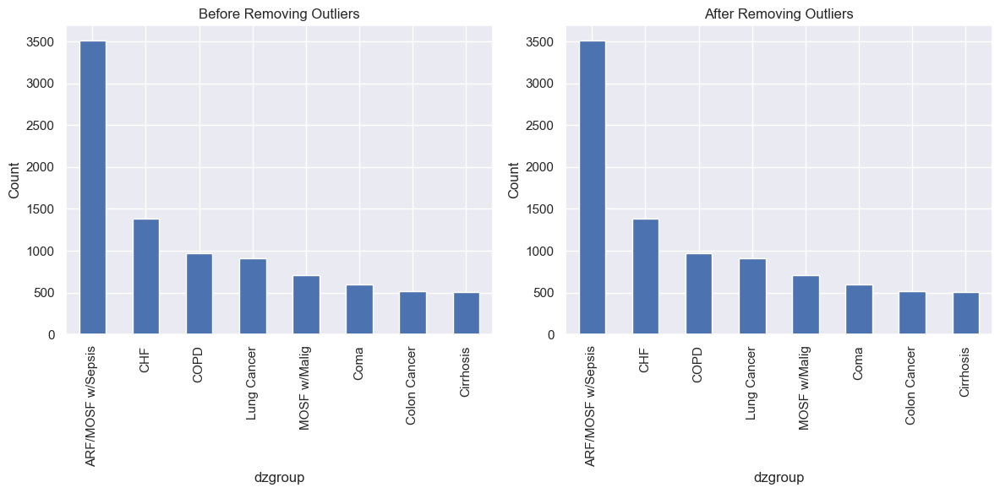

In [176]:
# เปรียบเทียบความถี่ของข้อมูลในคอลัมน์ที่ตัดค่า outliers ออกไป
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# ก่อนตัดค่า outliers
df['dzgroup'].value_counts().plot(kind='bar', ax=axes[0], title='Before Removing Outliers')
axes[0].set_xlabel('dzgroup')
axes[0].set_ylabel('Count')

# หลังตัดค่า outliers
new_df['dzgroup'].value_counts().plot(kind='bar', ax=axes[1], title='After Removing Outliers')
axes[1].set_xlabel('dzgroup')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

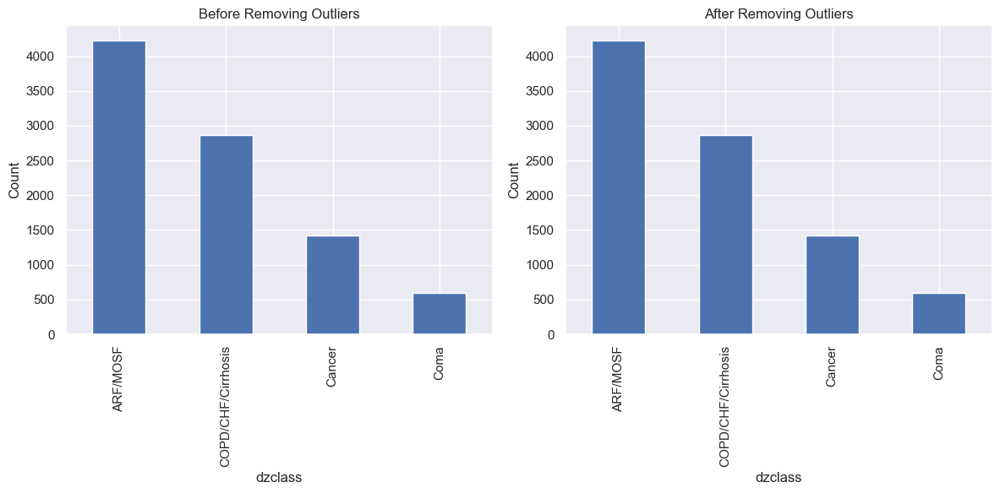

In [177]:
# เปรียบเทียบความถี่ของข้อมูลในคอลัมน์ที่ตัดค่า outliers ออกไป
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# ก่อนตัดค่า outliers
df['dzclass'].value_counts().plot(kind='bar', ax=axes[0], title='Before Removing Outliers')
axes[0].set_xlabel('dzclass')
axes[0].set_ylabel('Count')

# หลังตัดค่า outliers
new_df['dzclass'].value_counts().plot(kind='bar', ax=axes[1], title='After Removing Outliers')
axes[1].set_xlabel('dzclass')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()


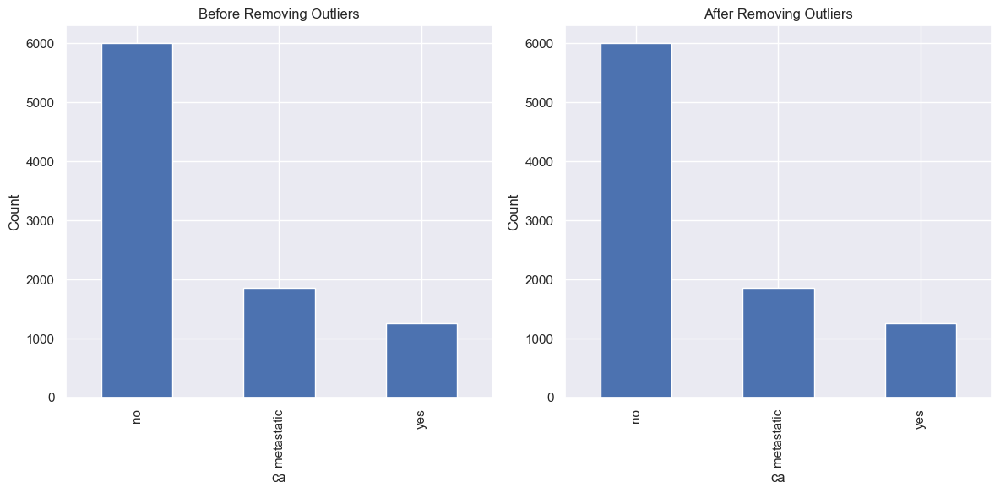

In [178]:
# เปรียบเทียบความถี่ของข้อมูลในคอลัมน์ที่ตัดค่า outliers ออกไป
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# ก่อนตัดค่า outliers
df['ca'].value_counts().plot(kind='bar', ax=axes[0], title='Before Removing Outliers')
axes[0].set_xlabel('ca')
axes[0].set_ylabel('Count')

# หลังตัดค่า outliers
new_df['ca'].value_counts().plot(kind='bar', ax=axes[1], title='After Removing Outliers')
axes[1].set_xlabel('ca')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

In [179]:
target = new_df['aps']

cate_no_outlier = new_df.select_dtypes(include=['object']).columns

num_no_outlier =new_df.select_dtypes(exclude=['object']).columns
# list(num_no_outlier)

## PART Feature Selection

Visual analysis an Statistical measurement of relationship strength between continuous vs continuous data

### Visual Exploration

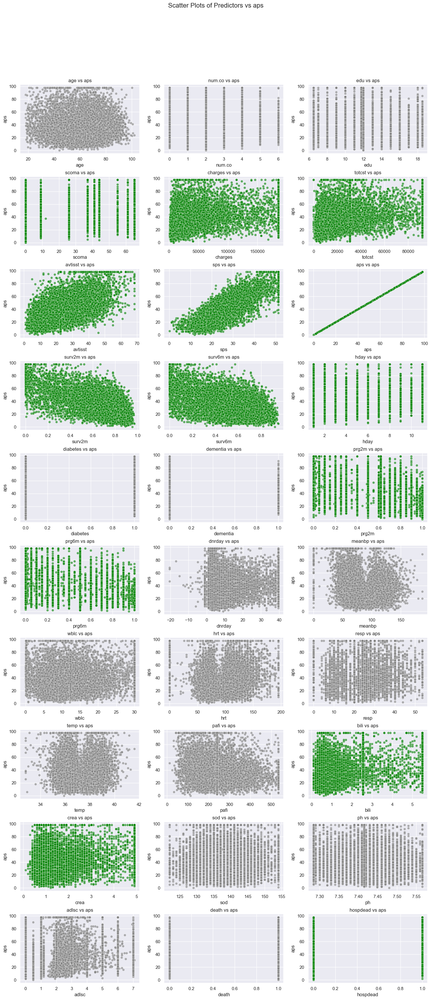


Trend Summary:


,Predictor,Trend
0,age,No
1,num.co,No
2,edu,No
3,scoma,Yes
4,charges,Yes
5,totcst,Yes
6,avtisst,Yes
7,sps,Yes
8,aps,Yes
9,surv2m,Yes


Total with Trend: 14
Total without Trend: 16


In [180]:
# Calculate the number of rows and columns for subplots
num_plots = len(num_no_outlier)
num_cols = 3  # Adjust as needed
num_rows = math.ceil(num_plots / num_cols)

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 35))
fig.suptitle('Scatter Plots of Predictors vs aps', fontsize=16)

# Set trend threshold
trend_threshold = 0.2  # Adjust as needed

# Store trend results
trend_results = []

# Iterate through predictors and create scatter plots
for i, predictor in enumerate(num_no_outlier):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    # Calculate correlation coefficient
    correlation = np.corrcoef(new_df[predictor], target)[0, 1]

    # Set color based on trend
    color = 'green' if abs(correlation) > trend_threshold else 'gray'

    ax.scatter(new_df[predictor], target, alpha=0.6, edgecolors='w', linewidth=0.5, color=color)
    ax.set_title(f'{predictor} vs aps')
    ax.set_xlabel(predictor)
    ax.set_ylabel('aps')

    # Store trend result
    trend_results.append({'Predictor': predictor, 'Trend': 'Yes' if abs(correlation) > trend_threshold else 'No'})

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(top=0.9)

plt.show()

# Create and display trend table
# Create and display trend table
trend_table = pd.DataFrame(trend_results)

# Calculate and add trend counts using pd.concat
trend_counts = trend_table['Trend'].value_counts().to_dict()
trend_table = pd.concat([trend_table, 
                         pd.DataFrame({'Predictor': ['Total with Trend', 'Total without Trend'], 
                                       'Trend': [trend_counts.get('Yes', 0), trend_counts.get('No', 0)]})],
                        ignore_index=True)

# Make the table wider
trend_table_styled = trend_table.style.set_properties(**{'width': '200px'})  # Adjust width as needed

print("\nTrend Summary:")
display(trend_table_styled)  # Display the styled table

# Display total counts below the table
print(f"Total with Trend: {trend_counts.get('Yes', 0)}")
print(f"Total without Trend: {trend_counts.get('No', 0)}")

#### Statistical Feature Selection

In [181]:
def corrmatrix(df):
    # numerical_df = df.select_dtypes(exclude=['object'])
    corr_matrix = new_df[num_no_outlier].corr()
    plt.figure(figsize=(30, 25))  # Set the figure size (optional)
  #  Plotting the correlation matrix with smaller font size for annotations
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, annot_kws={"size": 8})
    plt.title('Correlation Matrix')
    plt.show()
    corr_feature= corr_matrix['aps'][abs(corr_matrix['aps']) > 0.5 ]
    return corr_feature

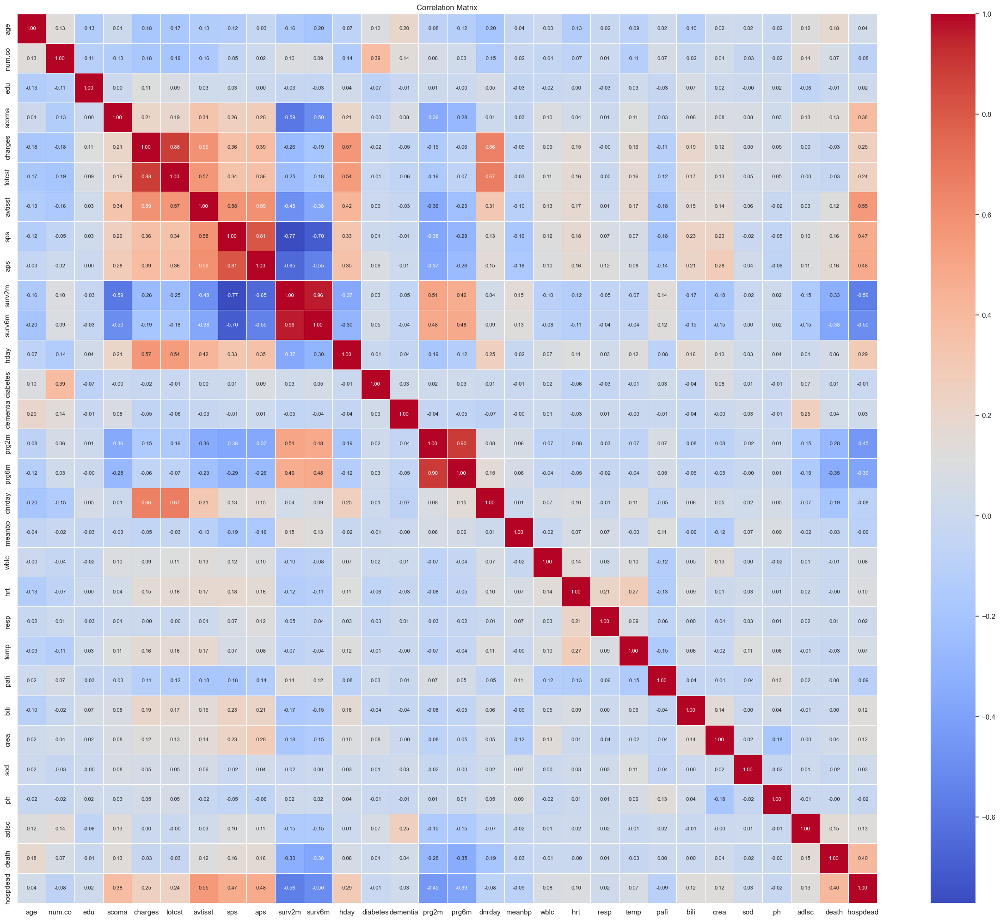

avtisst    0.594865
sps        0.808429
aps        1.000000
surv2m    -0.647799
surv6m    -0.549515
Name: aps, dtype: float64

In [182]:
corrmatrix(new_df)

In [183]:
def perform_anova(df, categorical_cols, target):

  """
  Performs ANOVA for multiple categorical columns.

  Args:
    df: DataFrame containing the data.
    categorical_cols: List of categorical column names.
    target_variable: Name of the continuous target variable.

  Returns:
    A dictionary containing F-statistic and p-value for each categorical column.
  """

  results = {}
  for col in categorical_cols:
    groups = df[col].unique()
    if len(groups) >= 2:  # ใช้ ANOVA ถ้ามี >2 class เท่านั้น
      group_data = [df[df[col] == g][target] for g in groups]
      f_statistic, p_value = f_oneway(*group_data)
      results[col] = {'F-statistic': f_statistic, 'P-value': p_value}
  return results

### Visual analysis an Statistical measurement of relationship strength between continuous vs categorical data

Visual Exploration

In [184]:
df['aps'].describe()

count    9105.000000
mean       37.597979
std        19.902758
min         0.000000
25%        23.000000
50%        34.000000
75%        49.000000
max       143.000000
Name: aps, dtype: float64

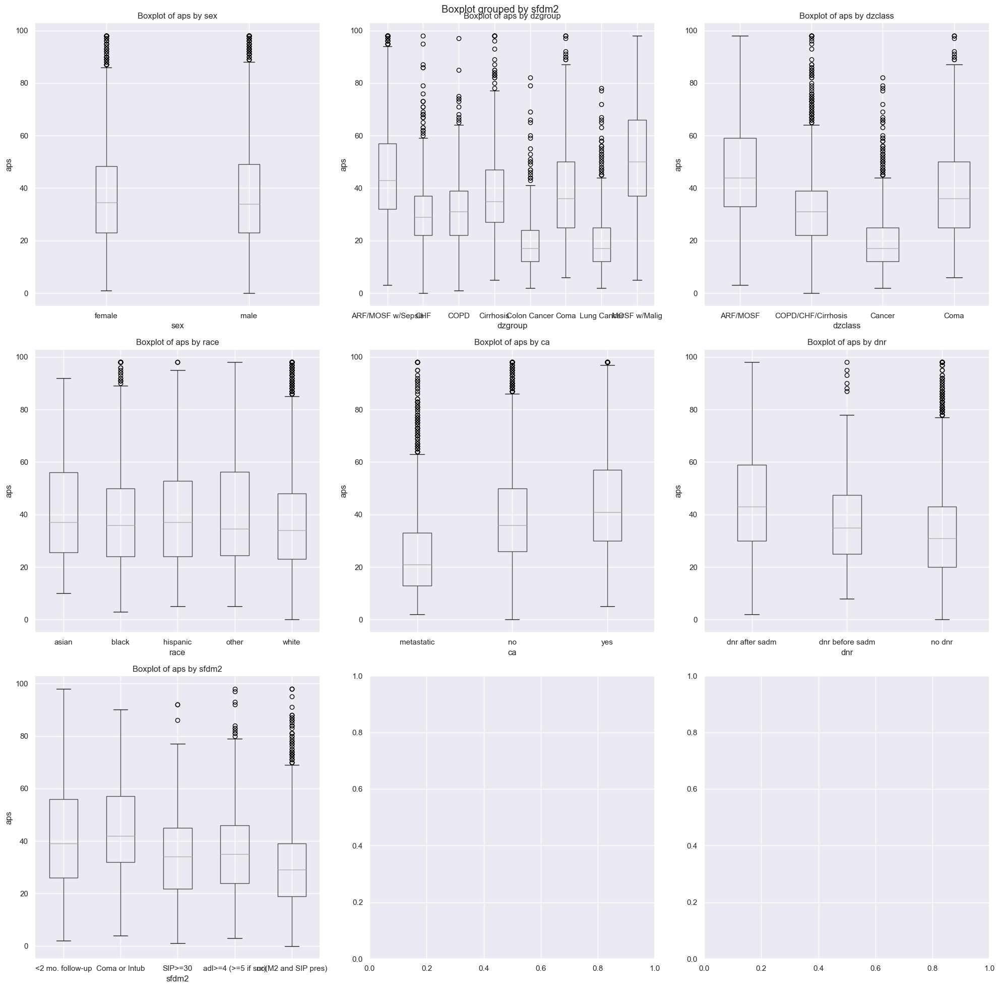

In [185]:
num_vars = len(cate_no_outlier)
num_column = 3
num_rows = (num_vars + num_column - 1) // num_column

rows=(len(cate_no_outlier) + 3 - 1) // 3
fig, PlotCanvas=plt.subplots(nrows=num_rows, ncols=3, figsize=(20,20))

# Boxplots แต่ละ predictors คู่กับ Target
for PredictorCol , i in zip(cate_no_outlier, range(len(cate_no_outlier))):
    row = i // num_column
    col = i % num_column
    ax = PlotCanvas[row, col]  # สร้างแกน subplot ของแต่ละ plot

    # ใช้ 'ax' กำหนด subplot
    new_df.boxplot(column='aps', by=PredictorCol, ax=ax, vert=True)

    ax.set_title(f'Boxplot of aps by {PredictorCol}')
    ax.set_xlabel(PredictorCol)
    ax.set_ylabel('aps')

plt.tight_layout()
plt.show()

จากการพล็อตกราฟข้างต้น สามารถสมมติฐานได้ว่า

| Feature | Relationship with Target | Selected/Removed |
|---|---|---|
| Sex | no relation | Removed |
| dzgroup | strong relation | Selected |
| dzclass | strong relation | Selected |
| race | no relation | Removed |
| ca | strong relation | Selected |
| dnr | weak relation | Selected |
| sfdm2 | weak relation | Selected |

#### Statistical Feature Selection (Method Used : ANOVA)

In [186]:
from scipy.stats import f_oneway

In [187]:
target = new_df['aps']
anova_results = perform_anova(new_df, cate_no_outlier, 'aps')

# Create a Pandas DataFrame from the results dictionary
anova_df = pd.DataFrame.from_dict(anova_results, orient='index')

# Sort the DataFrame by F-statistic in descending order
anova_df = anova_df.sort_values(by=['F-statistic'], ascending=False)

# Add a column indicating whether to remove the feature based on p-value
anova_df['Removed'] = anova_df['P-value'].apply(lambda p: '(P-value > 0.05, Removed)' if p > 0.05 else '')

# Display the DataFrame as a formatted table
display(anova_df)

# Display the rank of features
print("\nRank of Categorical data ความสัมพันธ์กับ Target (High to Low):")
for i, feature in enumerate(anova_df.index):
    print(f"{i+1}. {feature}{anova_df.loc[feature, 'Removed']}")

,F-statistic,P-value,Removed
dzclass,1075.667126,0.000000e+00,
ca,512.053347,1.831915e-211,
dzgroup,501.641223,0.000000e+00,
dnr,449.037535,1.039636e-186,
sfdm2,202.293135,1.735365e-166,
race,5.520329,1.952524e-04,
sex,0.201722,6.533450e-01,"(P-value > 0.05, Removed)"



Rank of Categorical data ความสัมพันธ์กับ Target (High to Low):
1. dzclass
2. ca
3. dzgroup
4. dnr
5. sfdm2
6. race
7. sex(P-value > 0.05, Removed)


## PART Selecting final predictors

โดยชุดข้อมูลที่เลือกมาเป็น Final Predictors ประกอบไปด้วย `avtisst`, `dzclass`, `dzgroup`, `ca`, `dnr`, `sfdm2`

> `sps`,`surv2m`,`surv6`ถูกตัดอออกเนื่องจากมีผลต่อเนื่องกับโมเดลที่เลือกมา

In [188]:
final_predict=['avtisst','dzclass','dzgroup','ca','dnr','sfdm2']
cols_delete = new_df.columns.difference(final_predict)
predict_df = new_df.drop(columns=cols_delete, axis=1)

# Display the DataFrame as a formatted table
display(predict_df)

,dzgroup,dzclass,avtisst,ca,dnr,sfdm2
0,Lung Cancer,Cancer,7.000000,metastatic,no dnr,<2 mo. follow-up
1,Cirrhosis,COPD/CHF/Cirrhosis,29.000000,no,no dnr,<2 mo. follow-up
2,Cirrhosis,COPD/CHF/Cirrhosis,13.000000,no,no dnr,<2 mo. follow-up
3,Lung Cancer,Cancer,7.000000,metastatic,no dnr,no(M2 and SIP pres)
4,ARF/MOSF w/Sepsis,ARF/MOSF,18.666656,no,no dnr,no(M2 and SIP pres)
...,...,...,...,...,...,...
9100,ARF/MOSF w/Sepsis,ARF/MOSF,20.333328,no,no dnr,<2 mo. follow-up
9101,Coma,Coma,18.000000,no,no dnr,<2 mo. follow-up
9102,ARF/MOSF w/Sepsis,ARF/MOSF,23.000000,no,no dnr,<2 mo. follow-up
9103,MOSF w/Malig,ARF/MOSF,35.500000,yes,dnr after sadm,<2 mo. follow-up


## PART Data Pre-processing for Machine Learning

ประกอบไปด้วย 4 วิธี ดังนี้


**Ordinal data to numeric :**

- ข้อมูลประเภทหนึ่งที่สามารถจัดลำดับหรือจัดอันดับได้ แต่ระยะห่างระหว่างแต่ละอันดับไม่เท่ากัน


**Binary data to numeric :**

- ข้อมูลที่มีค่าได้เพียงสองค่า เช่น 0 หรือ 1, True หรือ False, ใช่ หรือ ไม่ใช่การแปลงข้อมูลไบนารีเป็นตัวเลขเป็นขั้นตอนที่ตรงไปตรงมาและมักจะทำโดยอัตโนมัติโดยไลบรารีการเรียนรู้ของเครื่องส่วนใหญ่


**Ordinal variable to nummeric :**

- ตัวแปรที่สามารถจัดเรียงลำดับหรือจัดอันดับได้ แต่ระยะห่างระหว่างแต่ละอันดับไม่เท่ากัน 


**Data Transformation :**

- กระบวนการปรับเปลี่ยนข้อมูลจากรูปแบบหนึ่งไปเป็นอีกรูปแบบหนึ่ง เพื่อให้เหมาะสมกับการวิเคราะห์ข้อมูลหรือการสร้างแบบจำลองการเรียนรู้ของเครื่อง

>
    

    

### Ordinal data to numeric

> Selected Feature <span style="color:red"> ไม่มี Ordinal </span>

### Binary data to numeric

> Selected Feature <span style="color:red"> ไม่มี Ordinal </span>

### Ordinal variable to numeric

Selected Feature ที่เลือกมา `dzgroup`, `dzclass`, `ca`

In [189]:
preprocessed_df = pd.get_dummies(predict_df, columns=['dzgroup', 'dzclass', 'ca', 'dnr', 'sfdm2'])
all_columns = preprocessed_df.columns

# Print columns one per line
for column in all_columns:
    print(column)

# Alternatively, print in a formatted list
print(list(all_columns))

avtisst
dzgroup_ARF/MOSF w/Sepsis
dzgroup_CHF
dzgroup_COPD
dzgroup_Cirrhosis
dzgroup_Colon Cancer
dzgroup_Coma
dzgroup_Lung Cancer
dzgroup_MOSF w/Malig
dzclass_ARF/MOSF
dzclass_COPD/CHF/Cirrhosis
dzclass_Cancer
dzclass_Coma
ca_metastatic
ca_no
ca_yes
dnr_dnr after sadm
dnr_dnr before sadm
dnr_no dnr
sfdm2_<2 mo. follow-up
sfdm2_Coma or Intub
sfdm2_SIP>=30
sfdm2_adl>=4 (>=5 if sur)
sfdm2_no(M2 and SIP pres)
['avtisst', 'dzgroup_ARF/MOSF w/Sepsis', 'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis', 'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer', 'dzgroup_MOSF w/Malig', 'dzclass_ARF/MOSF', 'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma', 'ca_metastatic', 'ca_no', 'ca_yes', 'dnr_dnr after sadm', 'dnr_dnr before sadm', 'dnr_no dnr', 'sfdm2_<2 mo. follow-up', 'sfdm2_Coma or Intub', 'sfdm2_SIP>=30', 'sfdm2_adl>=4 (>=5 if sur)', 'sfdm2_no(M2 and SIP pres)']


### Data Transformation

In [190]:
target='aps'
Predictors=preprocessed_df.columns

In [191]:
standard_df = StandardScaler().fit_transform(preprocessed_df)
standard_df = pd.DataFrame(standard_df, columns=all_columns)


y=new_df[target]
x=standard_df[Predictors]

In [192]:
for column in standard_df.columns:
    print(column)


avtisst
dzgroup_ARF/MOSF w/Sepsis
dzgroup_CHF
dzgroup_COPD
dzgroup_Cirrhosis
dzgroup_Colon Cancer
dzgroup_Coma
dzgroup_Lung Cancer
dzgroup_MOSF w/Malig
dzclass_ARF/MOSF
dzclass_COPD/CHF/Cirrhosis
dzclass_Cancer
dzclass_Coma
ca_metastatic
ca_no
ca_yes
dnr_dnr after sadm
dnr_dnr before sadm
dnr_no dnr
sfdm2_<2 mo. follow-up
sfdm2_Coma or Intub
sfdm2_SIP>=30
sfdm2_adl>=4 (>=5 if sur)
sfdm2_no(M2 and SIP pres)


ทำการแบ่งข้อมูลเป็น ชุดการฝึก (Training Set) และ ชุดทดสอบ (Test Set) โดยกำหนดให้ -ชุดทดสอบมีสัดส่วน 30% ของข้อมูลทั้งหมด และอีก 70% เป็นชุดการฝึก

In [193]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

## PART Model Construction

### Linear Regression

In [194]:
print("X_train shape :", X_train.shape)
print("y_train shape :", y_train.shape)

X_train shape : (6373, 24)
y_train shape : (6373,)


In [195]:
print("X_test shape :", X_test.shape)
print("y_test shape :", y_test.shape)

X_test shape : (2732, 24)
y_test shape : (2732,)


**STEP 01**

สร้างชุดข้อมูลใหม่ที่ง่ายต่อการเข้าถึงจากชุดข้อมูลเดิม โดยโค้ดที่เขียนทำหน้าที่เลือกคอลัมน์เฉพาะจาก DataFrame ที่มีอยู่แล้ว `standard_df` โดยแยกออกเป็นคอลัมน์ประเภทข้อมูล categorical และ continuous ที่ต้องการใช้ จากนั้นจะสร้าง DataFrame ใหม่ คือ `new_dataset` ซึ่งประกอบด้วยคอลัมน์ที่เลือกไว้และทำการคัดลอกข้อมูลมาเพื่อไม่กระทบต่อ DataFrame เดิม

In [196]:
categorical_vars = ['dzgroup_ARF/MOSF w/Sepsis',
       'dzgroup_CHF', 'dzgroup_COPD', 'dzgroup_Cirrhosis',
       'dzgroup_Colon Cancer', 'dzgroup_Coma', 'dzgroup_Lung Cancer',
       'dzgroup_MOSF w/Malig', 'dzclass_ARF/MOSF',
       'dzclass_COPD/CHF/Cirrhosis', 'dzclass_Cancer', 'dzclass_Coma',
       'ca_metastatic', 'ca_no', 'ca_yes', 'dnr_dnr after sadm',
       'dnr_dnr before sadm', 'dnr_no dnr', 'sfdm2_<2 mo. follow-up',
       'sfdm2_Coma or Intub', 'sfdm2_SIP>=30', 'sfdm2_adl>=4 (>=5 if sur)',
       'sfdm2_no(M2 and SIP pres)']
continuous_vars =['avtisst']

In [197]:
# เลือกเฉพาะคอลัมน์ที่สำคัญจากชุดข้อมูลเดิม
selected_columns = categorical_vars + continuous_vars  # รวมรายชื่อคอลัมน์จาก categorical และ continuous

# สร้าง DataFrame ใหม่ที่มีเฉพาะคอลัมน์ที่เลือกไว้
new_dataset = standard_df[selected_columns].copy()

# ตรวจสอบ DataFrame ใหม่
print("ข้อมูลใหม่ที่ง่ายต่อการเข้าถึง:")
display(new_dataset.head().style.set_table_styles([{'selector': 'th', 'props': [ ('font-weight', 'bold')]}]))

ข้อมูลใหม่ที่ง่ายต่อการเข้าถึง:


,dzgroup_ARF/MOSF w/Sepsis,dzgroup_CHF,dzgroup_COPD,dzgroup_Cirrhosis,dzgroup_Colon Cancer,dzgroup_Coma,dzgroup_Lung Cancer,dzgroup_MOSF w/Malig,dzclass_ARF/MOSF,dzclass_COPD/CHF/Cirrhosis,dzclass_Cancer,dzclass_Coma,ca_metastatic,ca_no,ca_yes,dnr_dnr after sadm,dnr_dnr before sadm,dnr_no dnr,sfdm2_<2 mo. follow-up,sfdm2_Coma or Intub,sfdm2_SIP>=30,sfdm2_adl>=4 (>=5 if sur),sfdm2_no(M2 and SIP pres),avtisst
0,-0.792970,-0.423922,-0.344710,-0.243085,-0.244097,-0.264657,3.004585,-0.291260,-0.930883,-0.677077,2.326365,-0.264657,1.974951,-1.388399,-0.399286,-0.693346,-0.164186,0.735261,1.006501,-0.067256,-0.256972,-0.334451,-0.711655,-1.186678
1,-0.792970,-0.423922,-0.344710,4.113785,-0.244097,-0.264657,-0.332825,-0.291260,-0.930883,1.476937,-0.429855,-0.264657,-0.506342,0.720254,-0.399286,-0.693346,-0.164186,0.735261,1.006501,-0.067256,-0.256972,-0.334451,-0.711655,0.486309
2,-0.792970,-0.423922,-0.344710,4.113785,-0.244097,-0.264657,-0.332825,-0.291260,-0.930883,1.476937,-0.429855,-0.264657,-0.506342,0.720254,-0.399286,-0.693346,-0.164186,0.735261,1.006501,-0.067256,-0.256972,-0.334451,-0.711655,-0.730409
3,-0.792970,-0.423922,-0.344710,-0.243085,-0.244097,-0.264657,3.004585,-0.291260,-0.930883,-0.677077,2.326365,-0.264657,1.974951,-1.388399,-0.399286,-0.693346,-0.164186,0.735261,-0.993541,-0.067256,-0.256972,-0.334451,1.405175,-1.186678
4,1.261082,-0.423922,-0.344710,-0.243085,-0.244097,-0.264657,-0.332825,-0.291260,1.074249,-0.677077,-0.429855,-0.264657,-0.506342,0.720254,-0.399286,-0.693346,-0.164186,0.735261,-0.993541,-0.067256,-0.256972,-0.334451,1.405175,-0.299489


**STEP 02**

จากนั้นสร้างโมเดล Linear Regression ด้วยการเทรนข้อมูลความสัมพันธ์ระหว่างข้อมูลเข้า `X_train`  

และค่าผลลัพธ์ `y_train` 

In [198]:
model=LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

ต่อมาจะเป็นส่วนที่ใช่ Predict ข้อมูล โดยโมเดลใช้ความรู้ที่ได้จากการเทรนมาทำนายค่าผลลัพธ์ของชุดข้อมูลทดสอบ `X_test` และยังสามารถทำนายผลลัพธ์ของข้อมูลฝึก `X_train` เพื่อดูว่าโมเดลยังมีความเข้าใจข้อมูลเดิมอยู่

In [199]:
y_test_pred = model.predict(X_test)
y_train_pred = model.predict(X_train)

**STEP 03**

ตรวจสอบข้อมูลการทดสอบโดยเปรียบเทียบการทำนายของแบบจำลองกับค่าจริงด้วยการ Plot graph

โดยรายละเอียดทั้ง 2 กราฟมีดังนี้ :



- Scatter Plot: Actual vs. Predicted

        - แสดงการกระจายของค่าผลลัพธ์จริง (y_test) เทียบกับค่าผลลัพธ์ที่โมเดลทำนาย (y_test_pred)

        - เส้นสีแดงในกราฟแสดงเส้นอ้างอิง 𝑦 = 𝑥 y=x (คือเส้นที่ค่าจริง = ค่าทำนาย) ซึ่งช่วยให้เห็นว่าค่าทำนายใกล้เคียงกับค่าจริงหรือไม่

- Residual Plot

        - แสดงความแตกต่างระหว่างค่าจริงและค่าทำนาย (Residuals) เพื่อดูความผิดพลาดของการทำนายในแต่ละจุด 

        -เส้นสีแดงที่แกน 𝑦 = 0 y=0 แสดงว่าถ้าค่าที่กระจายอยู่ใกล้กับเส้นนี้ แปลว่าผลการทำนายมีความแม่นยำสูง

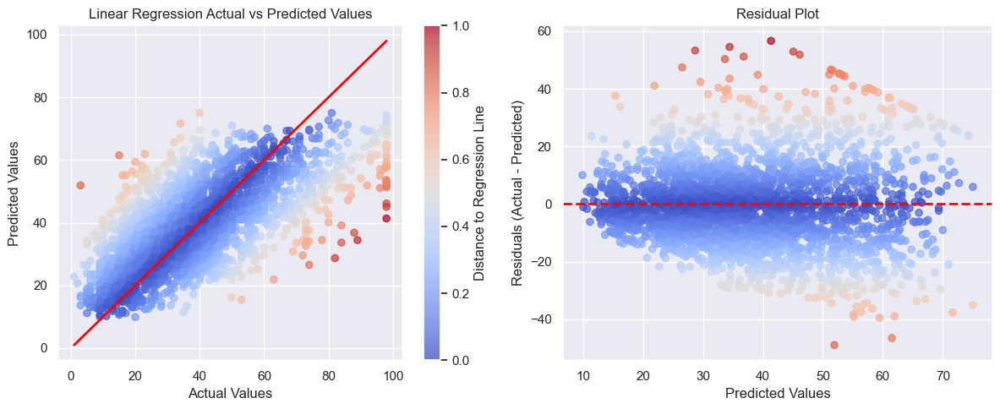


Color Scheme:


,Color,Meaning
0,Blue,Closer to Regression Line
1,Red,Further from Regression Line


In [200]:

plt.figure(figsize=(12, 5))

# Scatter plot: actual vs predicted
plt.subplot(1, 2, 1)

# Calculate distance to regression line
distances = np.abs(y_test - y_test_pred)

# Normalize distances to range between 0 and 1
normalized_distances = (distances - distances.min()) / (distances.max() - distances.min())

# Create colormap
cmap = plt.get_cmap('coolwarm')  # You can choose a different colormap if desired

# Scatter plot with color based on distance
plt.scatter(y_test, y_test_pred, alpha=0.7, c=normalized_distances, cmap=cmap)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='-', linewidth=2)
plt.title('Linear Regression Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)

# Add colorbar
cbar = plt.colorbar()
cbar.set_label('Distance to Regression Line')

# Residual plot: Actual - Predicted
plt.subplot(1, 2, 2)
residuals = y_test - y_test_pred

# Use the same normalized distances for color in the residual plot
plt.scatter(y_test_pred, residuals, alpha=0.7, c=normalized_distances, cmap=cmap)  
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()
# Create and display color scheme table
color_scheme_data = [{'Color': 'Blue', 'Meaning': 'Closer to Regression Line'},
                    {'Color': 'Red', 'Meaning': 'Further from Regression Line'}]
color_scheme_table = pd.DataFrame(color_scheme_data)
print("\nColor Scheme:")
display(color_scheme_table.style.set_properties(**{'width': '200px'}))  # Adjust width as needed

**การวิเคราะห์**

จุดข้อมูลใกล้ Linear Regression :
- บ่งชี้ว่าแบบจำลองกำลังทำนายที่ถูกต้องสำหรับจุดข้อมูลเหล่านั้น ส่วนที่เหลือน้อยลง จุดจะอยู่ใกล้กับเส้นมากขึ้น และการทำนายจะดีขึ้น โดยทั่วไปแล้วจุดเหล่านี้ถือว่าอธิบายได้ดีโดยแบบจำลอง



จุดข้อมูลไกล Linear Regression :
- บ่งชี้ว่าแบบจำลองไม่ได้ทำนายที่ถูกต้องสำหรับจุดข้อมูลเหล่านั้น ส่วนที่เหลือมากขึ้น จุดจะอยู่ห่างจากเส้นมากขึ้น และการทำนายจะแย่ลง โดยทั่วไปแล้วจุดเหล่านี้ถือว่าอธิบายได้ไม่ดีโดยแบบจำลอง

> **สรุป :**
จากการพล็อตกราฟดูข้างต้นสามารถสรุปได้ว่า ค่อนข้างมีความเเม่นยำสูง เเต่ยังมีความคาดเคลื่อนเกิดขึ้น

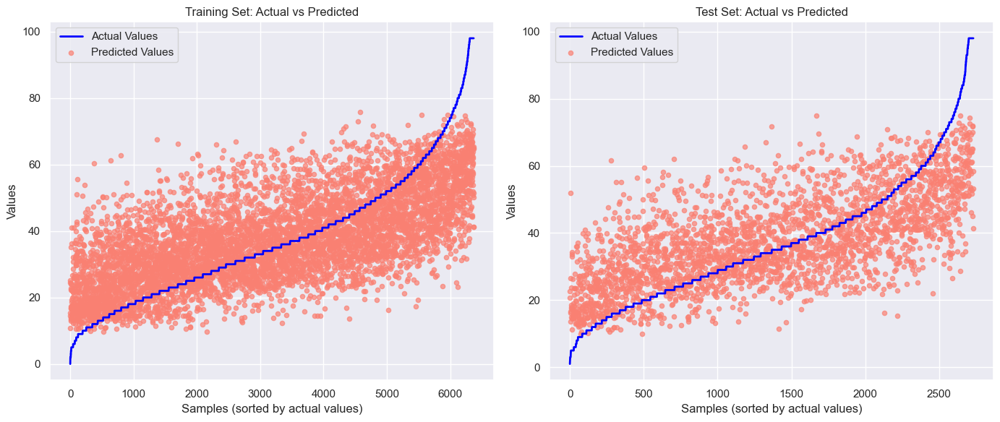

In [201]:
# เรียงค่าโดยอิงตาม Actual value เพื่อความชัดเจนของ plot
sorted_indices_train = np.argsort(y_train)
sorted_indices_test = np.argsort(y_test)


# Training Set plot
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
# Actual values line
plt.plot(y_train.iloc[sorted_indices_train].values, label='Actual Values', color='blue', linewidth=2)
# Predicted values scatter plot
plt.scatter(range(len(y_train)), y_train_pred[sorted_indices_train], label='Predicted Values', color='salmon', s=20, alpha=0.7)
plt.title('Training Set: Actual vs Predicted')
plt.xlabel('Samples (sorted by actual values)')
plt.ylabel('Values')
plt.legend()
plt.grid(True)

# Test Set Plot
plt.subplot(1, 2, 2)
# Actual values line
plt.plot(y_test.iloc[sorted_indices_test].values, label='Actual Values', color='blue', linewidth=2)
# Predicted values scatter plot
plt.scatter(range(len(y_test)), y_test_pred[sorted_indices_test], label='Predicted Values', color='salmon', s=20, alpha=0.7) # Changed y_pred to y_test_pred
plt.title('Test Set: Actual vs Predicted')
plt.xlabel('Samples (sorted by actual values)')
plt.ylabel('Values')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

**จากนั้นจะค้นหาค่าความแม่นยำ**

- การหาค่า Mean Absolute Percentage Error (MAPE) และ Mean Absolute Percentage Accuracy (MAPA)
        
    *   MAPE จะวัดค่าเปอร์เซ็นต์ความผิดพลาดโดยเฉลี่ยระหว่างค่าจริง `y_test` และค่าทำนาย `y_test_pred` ซึ่งแสดงถึงข้อผิดพลาดเป็นเปอร์เซ็นต์
    *   MAPA แสดงความแม่นยำเป็นเปอร์เซ็นต์ โดยการลบค่า MAPE ออกจาก 100% ค่ายิ่งสูงแสดงถึงความแม่นยำในการทำนายที่ดีขึ้น

- การหาค่า Cross-Validation
    * ใช้ cross_val_score กับโมเดลและข้อมูล (x และ y) โดยทำ cross-validation แบบ 5-fold และวัดผลด้วยคะแนน R^2.
    *   แสดงค่า R^2 สำหรับแต่ละ fold รวมถึงค่าเฉลี่ยและส่วนเบี่ยงเบนมาตรฐานของ R^2 เพื่อให้เห็นภาพรวมความเสถียรและความแม่นยำของโมเดลบนชุดข้อมูลต่างๆ

In [202]:
from sklearn.model_selection import cross_val_score
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
mapa = 100 - mape

print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"Mean Absolute Percentage Accuracy (MAPA): {mapa:.2f}%\n")

cv_scores = cross_val_score(model, x, y, cv=5, scoring='r2')

# Create a DataFrame for cross-validation results
cv_results_df = pd.DataFrame({
    "Fold": range(1, len(cv_scores) + 1),
    "R^2 Score": cv_scores
})

# Add rows for mean and standard deviation
cv_results_df.loc[len(cv_results_df)] = ["Mean", cv_scores.mean()]
cv_results_df.loc[len(cv_results_df)] = ["Standard Deviation", cv_scores.std()]

# Display the table
print("\nCross-validation Results:")
display(cv_results_df.style.set_properties(**{'width': '200px'}))  # Adjust width as needed

Mean Absolute Percentage Error (MAPE): 41.99%
Mean Absolute Percentage Accuracy (MAPA): 58.01%


Cross-validation Results:


,Fold,R^2 Score
0,1,0.496786
1,2,0.366861
2,3,0.472002
3,4,0.415127
4,5,0.365292
5,Mean,0.423214
6,Standard Deviation,0.053645


#### Check the overfit of the model

In [203]:
# ประเมินผลลัพธ์ training set
train_mse = mean_squared_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)


# ประเมินผลลัพธ์ test set
test_mse = mean_squared_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)

# แสดงผลลัพธ์
print(f"Training Set Performance:")
print(f"Mean Squared Error: {train_mse:.4f}")
print(f"R-squared: {train_r2:.4f}\n")

print(f"Test Set Performance:")
print(f"Mean Squared Error: {test_mse:.4f}")
print(f"R-squared: {test_r2:.4f}\n")


# ตรวจสอบ Overfitting
if train_r2 > test_r2 and abs(train_r2 - test_r2) > 0.1:
    print("The model is overfitting, as the training set performance is significantly better than the test set performance.")
else:
    print("The model does not appear to be overfitting.")

Training Set Performance:
Mean Squared Error: 214.0382
R-squared: 0.4466

Test Set Performance:
Mean Squared Error: 205.4231
R-squared: 0.4479

The model does not appear to be overfitting.


### Random Forest

In [204]:
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

ตั้งค่าและฝึกโมเดล RandomForestRegressor ด้วยการกำหนดค่า hyperparameters ที่คุณต้องการ โดยใช้ข้อมูล X_train และ y_train สำหรับการเทรนโมเดลและทำนายผลลัพธ์ในข้อมูล X_test

In [ ]:
rf_regressor=RandomForestRegressor(random_state=42)
# กำหนด hyperparameter grid
param_grid = {
    'max_depth': [2,5,10,20,30,40 ],
    'min_samples_split': [2, 5,10],
    'min_samples_leaf': [1 ,2,5,10],
    'max_features': [ 'sqrt', 'log2'],
    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson']
}

# Hyperparameter tuning with Grid Search
grid_search = GridSearchCV(rf_regressor, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# แสดง Parameter ที่ดีมราสุด
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

In [ ]:
rf_regressor = RandomForestRegressor(
    n_estimators=250,         # จำนวน tree
    max_depth=7,             # จำนวนชั้นสูงสุด
    min_samples_split=6,      # จำนวน sample ขั้นต่ำที่ใช้แยก node
    min_samples_leaf=2,       # จำนวน sample ขั้นต่ำใน leaf node
    max_features='sqrt',      # จำนวน feature ที่ดีที่สุดถ้าจะ split
    bootstrap=True,           # ใช้ bootstrap model
    random_state=42,          # การสุ่มค่าทุกครั้งที่ train
    n_jobs=-1,                # ใช้ CPU core ทั้งคู่
    oob_score=True            # ใช้ out-of-bag samples
)

DT=rf_regressor.fit(X_train,y_train)
y_pred_rf = rf_regressor.predict(X_test)

#### Random forest result

- ประเมินประสิทธิภาพของโมเดล RandomForestRegressor โดยใช้ metrics หลายตัว รวมถึง Mean Absolute Percentage Error (MAPE), Mean Squared Error (MSE), และ R-squared (R²) score และยังใช้ cross-validation เพื่อประเมินโมเดลเพิ่มเติมอีกด้วย
  - Mean Absolute Percentage Error (MAPE) และ Mean Absolute Percentage Accuracy (MAPA)
    - คำนวณ MAPE โดยหาค่าเฉลี่ยของความผิดพลาดเชิงสัมบูรณ์ระหว่างค่าจริง (y_test) และค่าที่ทำนาย (y_pred_rf) ในรูปเปอร์เซ็นต์
    - MAPA แสดงถึงความแม่นยำเฉลี่ยของการทำนายในรูปเปอร์เซ็นต์ โดยใช้สูตร
      <br>
                       MAPA = 100 − MAPE

In [ ]:
# ประเมิน model

mape = np.mean(np.abs((y_test - y_pred_rf) / y_test)) * 100
mapa = 100 - mape

print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"Mean Absolute Percentage Accuracy (MAPA): {mapa:.2f}%")
y_train_rf = rf_regressor.predict(X_train)

train_mse = mean_squared_error(y_train, y_train_rf)
train_r2 = r2_score(y_train, y_train_rf)


# ประเมินผลลัพธ์ test set

test_mse = mean_squared_error(y_test, y_pred_rf)
test_r2 = r2_score(y_test, y_pred_rf)

# แสดงผลลัพธ์
print(f"Training Set Performance:")
print(f"Mean Squared Error: {train_mse:.4f}")
print(f"R-squared: {train_r2:.4f}\n")

print(f"Test Set Performance:")
print(f"Mean Squared Error: {test_mse:.4f}")
print(f"R-squared: {test_r2:.4f}\n")

cv_scores = cross_val_score(rf_regressor, x, y, cv=5, scoring='r2')

#cross-validation scores
print("Cross-validation R^2 scores:", cv_scores)
print("Mean R^2 score:", cv_scores.mean())
print("Standard deviation of R^2 score:", cv_scores.std())

```
Mean Absolute Percentage Error (MAPE): 42.87%
Mean Absolute Percentage Accuracy (MAPA): 57.13%
Training Set Performance:
Mean Squared Error: 205.9715
R-squared: 0.4592

Test Set Performance:
Mean Squared Error: 211.9734
R-squared: 0.4507

Cross-validation R^2 scores: [0.47541695 0.36944321 0.45556428 0.40808055 0.37929364]
Mean R^2 score: 0.41755972622088483
Standard deviation of R^2 score: 0.04162007243194751
```

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_train, y_train_rf)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Random Forest Actual vs Predicted Values of Train set")
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')  # Diagonal line
plt.subplot(1, 2, 2)
residuals = y_train - y_train_rf
plt.scatter(y_train_rf, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="Random_Tree.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_test, y_pred_rf)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Random Forest Actual vs Predicted Values of Test set")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')  # Diagonal line
plt.subplot(1, 2, 2)
residuals = y_test - y_pred_rf
plt.scatter(y_pred_rf, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="Random_Tree_2.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

### Decision Tree

- โค้ดนี้ใช้การค้นหา Grid Search เพื่อหาค่าพารามิเตอร์ที่ดีที่สุด (best hyperparameters) สำหรับโมเดล DecisionTreeRegressor จากนั้นสร้างโมเดลโดยกำหนด dtree เป็น DecisionTreeRegressor พร้อม random_state=42 เพื่อให้ผลลัพธ์มีความเสถียรและสามารถทำซ้ำได้
- ต่อมาจะค้นหาค่าที่ดีที่สุดด้วย Grid Search โดยจะใช้ GridSearchCV สำหรับการปรับค่าพารามิเตอร์โดยการทดสอบค่าทั้งหมดใน param_grid พร้อมกำหนด scoring='neg_mean_squared_error' เพื่อวัดประสิทธิภาพของโมเดล (ใช้ค่า MSE ที่เป็นลบ) นำค่าที่ได้ไปเทรนโมเดลเพื่อให้ Grid Search หาค่าพารามิเตอร์ที่ดีที่สุดจากข้อมูลฝึก (X_train, y_train)

In [ ]:
dtree=DecisionTreeRegressor(random_state=42)
# กำหนดค่า hyperparameter grid
param_grid = {
    'max_depth': [2,5,10,20,30,40 ],# จำนวนชั้นสูงสุด
    'min_samples_split': [2, 5,10],# จำนวน sample ขั้นต่ำที่ใช้แยก node
    'min_samples_leaf': [1 ,2,5,10],# จำนวน sample ขั้นต่ำใน leaf node
    'max_features': [ 'sqrt', 'log2'],# จำนวน feature ที่ดีที่สุดถ้าจะ split

    'criterion': ['squared_error', 'friedman_mse', 'absolute_error', 'poisson']# วัดคุณภาพที่ได้จากการ split
}

# Hyperparameter tuning with Grid Search
grid_search = GridSearchCV(dtree, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

# เอา parameter ที่กีที่สุด มา Train model
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

Best Hyperparameters: {'criterion': 'poisson', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 5, 'min_samples_split': 2}

- โค้ดนี้จะเป็นการสร้างและฝึกโมเดล DecisionTreeRegressor โดยใช้ค่าพารามิเตอร์ที่กำหนดเอง  และใช้โมเดลนี้ในการpredictผลลัพธ์ของข้อมูลทดสอบ

In [ ]:
dtree=DecisionTreeRegressor(
    criterion='absolute_error',
    max_depth=7,                 # จำนวนชั้นสูงสุด
    min_samples_leaf=6,           # จำนวน sample ขั้นต่ำใน leaf node
    min_samples_split=2,         # จำนวน sample ขั้นต่ำที่ใช้แยก node
    max_features='sqrt',          # จำนวน feature ที่ดีที่สุดถ้าจะ split
    random_state=42               # สุ่ม data set ทุกการ train
)
DT=dtree.fit(X_train,y_train)
y_pred_dt = dtree.predict(X_test)

#### Decision Tree Result

- ต่อมาประเมินประสิทธิภาพของโมเดล DecisionTreeRegressor ทั้งในชุดข้อมูลฝึก (training set) และชุดข้อมูลทดสอบ (test set) โดยใช้ตัวชี้วัด คือ MAPE, MAPA, MSE, R-squared จากนั้นตรวจสอบประสิทธิภาพของโมเดลผ่าน cross-validation

In [ ]:
mape = np.mean(np.abs((y_test - y_pred_dt) / y_test)) * 100
mapa = 100 - mape

print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"Mean Absolute Percentage Accuracy (MAPA): {mapa:.2f}%\n")
y_train_dt = dtree.predict(X_train)

train_mse = mean_squared_error(y_train, y_train_dt)
train_r2 = r2_score(y_train, y_train_dt)


# ประเมินผลลัพธ์ test set
test_mse = mean_squared_error(y_test, y_pred_dt)
test_r2 = r2_score(y_test, y_pred_dt)

# แสดงผลลัพธ์
print(f"Training Set Performance:")
print(f"Mean Squared Error: {train_mse:.4f}")
print(f"R-squared: {train_r2:.4f}\n")

print(f"Test Set Performance:")
print(f"Mean Squared Error: {test_mse:.4f}")
print(f"R-squared: {test_r2:.4f}\n")

cv_scores = cross_val_score(dtree, x, y, cv=5, scoring='r2')

# cross-validation scores
print("Cross-validation R^2 scores:", cv_scores)
print("Mean R^2 score:", cv_scores.mean())
print("Standard deviation of R^2 score:", cv_scores.std())

```
Mean Absolute Percentage Error (MAPE): 40.66%
Mean Absolute Percentage Accuracy (MAPA): 59.34%

Training Set Performance:
Mean Squared Error: 219.0565
R-squared: 0.4248

Test Set Performance:
Mean Squared Error: 222.4291
R-squared: 0.4236

Cross-validation R^2 scores: [0.43132063 0.30574063 0.40577083 0.33053261 0.32399591]
Mean R^2 score: 0.3594721238179493
Standard deviation of R^2 score: 0.049576018011553646
```

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_train, y_train_dt)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Decision Tree Actual vs Predicted Values of Test set")
plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--')

plt.tight_layout()
plt.show()
plt.subplot(1, 2, 2)

residuals = y_train - y_train_dt
plt.scatter(y_train_dt, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="desicion.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

<img src="desicion_2.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

### SVR

In [ ]:
from sklearn.svm import SVR

- เทรนและประเมินผลของโมเดล SVR โดยใช้เคอร์เนลแบบ RBF กำหนดให้ค่า C=1.0 และ epsilon=0.1
  - การวัดประสิทธิภาพโมเดลด้วย(MAPE & MAPA)
mape: คำนวณค่า Mean Absolute Percentage Error ในชุดข้อมูลทดสอบ ซึ่งแสดงถึงค่าเฉลี่ยของความผิดพลาดในเชิงเปอร์เซ็นต์
mapa: คำนวณค่า Mean Absolute Percentage Accuracy เป็นค่าความแม่นยำในเชิงเปอร์เซ็นต์ โดยคำนวณจาก 100 - mape
  - ประเมินผลของโมเดลด้วย train_mse และ test_mse: คำนวณค่า Mean Squared Error (MSE) สำหรับชุดข้อมูลฝึกและทดสอบ แสดงถึงค่าเฉลี่ยของผลต่างยกกำลังสองระหว่างค่าจริงและค่าที่ทำนาย
train_r2 และ test_r2: คำนวณค่า R-squared สำหรับชุดข้อมูลฝึกและทดสอบ เพื่อแสดงถึงสัดส่วนของความแปรปรวนที่โมเดลสามารถอธิบายได้
  - ตรวจสอบความแม่นยำด้วย Cross-Validation ด้วย cv_scores = cross_val_score(svr_model, x, y, cv=5, scoring='r2'): ทำการ cross-validation แบบ 5-fold บนข้อมูล เพื่อหาค่า R-squared score สำหรับแต่ละ fold
ค่าเฉลี่ยและค่าเบี่ยงเบนมาตรฐานของ R-squared ที่ได้จาก cross-validation แสดงถึงความเสถียรของโมเดลเมื่อนำไปใช้กับชุดข้อมูลย่อยต่าง ๆ

In [ ]:
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr_model.fit(X_train, y_train)

# predictions
y_train_svr = svr_model.predict(X_train)
y_test_svr = svr_model.predict(X_test)

mape = np.mean(np.abs((y_test - y_test_svr) / y_test)) * 100
mapa = 100 - mape

print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"Mean Absolute Percentage Accuracy (MAPA): {mapa:.2f}%\n")
# ประเมิน model
train_mse = mean_squared_error(y_train, y_train_svr)
train_r2 = r2_score(y_train, y_train_svr)


# ประเมินผลลัพธ์ test set
test_mse = mean_squared_error(y_test, y_test_svr)
test_r2 = r2_score(y_test, y_test_svr)
mse_train = mean_squared_error(y_train, y_train_svr)


# แสดงผลลัพธ์
print(f"Training Set Performance:")
print(f"Mean Squared Error: {train_mse:.4f}")
print(f"R-squared: {train_r2:.4f}\n")

print(f"Test Set Performance:")
print(f"Mean Squared Error: {test_mse:.4f}")
print(f"R-squared: {test_r2:.4f}\n")

cv_scores = cross_val_score(svr_model, x, y, cv=5, scoring='r2')

#cross-validation scores
print("Cross-validation R^2 scores:", cv_scores)
print("Mean R^2 score:", cv_scores.mean())
print("Standard deviation of R^2 score:", cv_scores.std())

```
Mean Absolute Percentage Error (MAPE): 40.22%
Mean Absolute Percentage Accuracy (MAPA): 59.78%

Training Set Performance:
Mean Squared Error: 216.8869
R-squared: 0.4305

Test Set Performance:
Mean Squared Error: 213.8272
R-squared: 0.4459

Cross-validation R^2 scores: [0.46425113 0.37096284 0.44623302 0.40646687 0.37447337]
Mean R^2 score: 0.41247744501533934
Standard deviation of R^2 score: 0.03748026841774508
```

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_test, y_test_svr, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("SVR Predictions vs Actual Values of Test set")
plt.show()
plt.subplot(1, 2, 2)
residuals = y_test - y_test_svr
plt.scatter(y_test_svr, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="SVR.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

<img src="SVR_2.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_train, y_train_svr, alpha=0.5)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("SVR Predictions vs Actual Values of Train set")
plt.subplot(1, 2, 2)
residuals = y_train - y_train_svr
plt.scatter(y_train_svr, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="SVR_3.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

### K-NN

- จะใช้ KNeighborsRegressor สร้างโมเดลแบบ k-Nearest Neighbors (k-NN) ในการพยากรณ์ (regression) โดยจะประเมินประสิทธิภาพของโมเดลด้วย ชุดข้อมูลฝึก (training set) และชุดข้อมูลทดสอบ (test set) รวมถึงการใช้ cross-validation ในการตรวจสอบประสิทธิภาพของโมเดล

In [ ]:
from sklearn.neighbors import KNeighborsRegressor

- จะทำการสร้างและฝึกโมเดล k-Nearest Neighbors (k-NN) โดยโมเดล KNeighborsRegressor ถูกกำหนดให้ใช้ n_neighbors=5 ในการพิจารณาข้อมูล 5 จุดที่ใกล้ที่สุดในการทำการพยากรณ์ค่าใหม่
- จากนั้นจะ predict ผลลัพธ์ โดยการกำหนดให้
  - y_train_knn คือผลลัพธ์การพยากรณ์ของชุดข้อมูลฝึก
  - y_test_knn คือผลลัพธ์การพยากรณ์ของชุดข้อมูลทดสอบ
- จากนั้นหาค่า  MAPE และ MAPA
- ประเมินผลชุดข้อมูลฝึก (training set)
- ประเมินผลชุดข้อมูลทดสอบ (test set)
- ได้ค่า Cross-Validation ในการใช้บอกประสิทธิภาพของโมเดลโดยการใช้ cross_val_score ในการประเมินค่า R-squared โดยแบ่งข้อมูลเป็น 5 ส่วน (cv=5) เพื่อวัดค่าความเสถียรของโมเดล

In [ ]:
knn_model=KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train, y_train)

y_train_knn = knn_model.predict(X_train)
y_test_knn = knn_model.predict(X_test)

# ประเมิน model
train_mse = mean_squared_error(y_train, y_train_knn)
train_r2 = r2_score(y_train, y_train_knn)


# ประเมินผลลัพธ์ test set
mape = np.mean(np.abs((y_test - y_test_knn) / y_test)) * 100
mapa = 100 - mape

print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"Mean Absolute Percentage Accuracy (MAPA): {mapa:.2f}%\n")
test_mse = mean_squared_error(y_test, y_test_knn)
test_r2 = r2_score(y_test, y_test_knn)
mse_train = mean_squared_error(y_train, y_train_knn)


# แสดงผลลัพธ์
print(f"Training Set Performance:")
print(f"Mean Squared Error: {train_mse:.4f}")
print(f"R-squared: {train_r2:.4f}\n")

print(f"Test Set Performance:")
print(f"Mean Squared Error: {test_mse:.4f}")
print(f"R-squared: {test_r2:.4f}\n")

cv_scores = cross_val_score(knn_model, x, y, cv=5, scoring='r2')

#cross-validation scores
print("Cross-validation R^2 scores:", cv_scores)
print("Mean R^2 score:", cv_scores.mean())
print("Standard deviation of R^2 score:", cv_scores.std())

```
Mean Absolute Percentage Error (MAPE): 44.28%
Mean Absolute Percentage Accuracy (MAPA): 55.72%

Training Set Performance:
Mean Squared Error: 174.8755
R-squared: 0.5408

Test Set Performance:
Mean Squared Error: 246.5979
R-squared: 0.3610

Cross-validation R^2 scores: [0.40610841 0.25753232 0.40334416 0.296262   0.26064097]
Mean R^2 score: 0.32477757207349855
Standard deviation of R^2 score: 0.06668729855559581
```

- การพยากรณ์ KNN เทียบกับค่าจริง (Predictions vs. Actual Values)

  - จุดที่อยู่ใกล้เส้นประสีแดง 45 องศาแสดงถึงค่าPredictที่แม่นยำ แต่ในหลายจุดเบี่ยงเบนจากเส้นนี้จะแสดงว่าโมเดลมีการพยากรณ์ที่ผิดพลาดพอสมควร
  - กระจายตัวของจุดทั้งเหนือและใต้เส้น 45 องศา ชี้ให้เห็นว่าโมเดลมีปัญหาในการพยากรณ์ที่ค่าเฉลี่ยอยู่ทั้งสูงกว่าและต่ำกว่าค่าจริง

- กราฟ Residual Plot

  - แสดงความแตกต่าง (Residuals) ระหว่างค่าจริงและค่าพยากรณ์ ซึ่งค่าความคลาดเคลื่อนควรกระจายอยู่รอบๆ เส้นสีแดงที่ศูนย์ หากการพยากรณ์ที่ได้มีความแม่นยำ
  - จากกราฟนี้สามารถเห็นได้ว่าค่าความคลาดเคลื่อนกระจายตัวสูง ทั้งบวกและลบ โดยไม่มีรูปแบบที่ชัดเจน ซึ่งบ่งบอกว่ามีปัญหาการพยากรณ์ที่กระจายอยู่ในทุกระดับของค่าที่พยากรณ์

In [ ]:
plt.subplot(1,2,1)
plt.scatter(y_test, y_test_knn, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')  # 45-degree line
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("KNN Predictions vs Actual Values of Test set")
plt.subplot(1, 2, 2)
residuals = y_test - y_test_knn
plt.scatter(y_test_knn, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="K-NN.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

- การพยากรณ์ KNN เทียบกับค่าจริงในชุดฝึกสอน

  - จุดที่อยู่ใกล้เส้นประสีแดง 45 องศาแสดงถึงการพยากรณ์ที่ใกล้เคียงกับค่าจริง อย่างไรก็ตาม มีจุดหลายจุดที่กระจายตัวออกจากเส้นประ ซึ่งแสดงว่าโมเดลมีความคลาดเคลื่อนอยู่ในระดับหนึ่ง
  - การกระจายตัวนี้บ่งชี้ว่ามีทั้งการพยากรณ์ที่ต่ำกว่าค่าจริงและสูงกว่าค่าจริง ทำให้เห็นว่าการทำนายยังมีความคลาดเคลื่อนในหลายกรณี
- กราฟ Residual Plot ของชุดฝึกสอน

  - Residuals (ค่าความคลาดเคลื่อน) กระจายตัวอยู่รอบๆ เส้นศูนย์โดยไม่มีรูปแบบที่ชัดเจน ซึ่งบ่งบอกว่าโมเดลอาจไม่ได้มีปัญหาด้านความไม่สมดุล (bias) ในการพยากรณ์มากนัก
 - การกระจายตัวของ residuals ที่กว้างขึ้นในบางช่วงอาจบ่งบอกถึงการคาดการณ์ที่ไม่แม่นยำในค่าที่สูงกว่าและต่ำกว่า

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_train, y_train_knn, alpha=0.5)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("KNN Predictions vs Actual Values of Train set")
plt.subplot(1, 2, 2)
residuals = y_train - y_train_knn
plt.scatter(y_train_knn, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="K-NN_2.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

### Neural Network

In [206]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasRegressor

- สร้างและปรับแต่งโมเดลโดยการใช้เทคนิค Grid Search เพื่อค้นหาค่าของไฮเปอร์พารามิเตอร์ที่ดีที่สุดสำหรับโมเดล ซึ่งเป็นการช่วยเพิ่มประสิทธิภาพและความแม่นยำของโมเดลให้มากที่สุด

In [ ]:
def create_model(learning_rate=0.01, neurons=64):
    model = Sequential([
        Dense(neurons, activation='relu', input_shape=(X_train.shape[1],)),
        Dense(neurons // 2, activation='relu'),
        Dense(neurons // 4, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer=Adam(learning_rate=learning_rate))
    return model

#  KerasRegressor object, wrapping  model
nn = KerasRegressor(model=create_model, learning_rate=0.01, neurons=64, verbose=0)

# กำหนด hyperparameter grid
param_grid = {
    'learning_rate': [0.001, 0.01, 0.1],
    'neurons': [32, 64, 128],
    'batch_size': [16, 32, 64],
    'epochs': [20, 30, 40]
}

# grid search
grid = GridSearchCV(estimator=nn, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error')
grid_result = grid.fit(X_train, y_train)

- จากนั้นใช้ Keras Tuner เพื่อทำการจูนไฮเปอร์พารามิเตอร์ของโมเดลโครงข่ายประสาทเทียม (Neural Network) สำหรับงาน Regression

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import numpy as np
import keras_tuner as kt

# ระบุ model builder function
def build_model(hp):
    model = Sequential()

    # Tune จำนวน layers และ units ในแต่ละ layer
    for i in range(hp.Int('num_layers', 1, 3)):  # Tune ระหว่าง 1 - 3 layers
        model.add(Dense(units=hp.Int(f'units_{i}', min_value=32, max_value=128, step=32),
                        activation='relu'))

    # Output layer  regression
    model.add(Dense(1))

    # Compile the model
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='mean_squared_error',
        metrics=['mean_absolute_error']
    )
    return model

# กำหนดค่าเริ่มต้น Keras Tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=30,
    factor=3,
    directory='hyperparameter_tuning',
    project_name='neural_net_regression'
)

# search
tuner.search(X_train, y_train, epochs=50, validation_split=0.2)

# หา hyperparameters and model ที่ดีที่สุด
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
best_model = tuner.get_best_models(num_models=1)[0]

# แสดง best hyperparameters
print(f"Best learning rate: {best_hps.get('learning_rate')}")
print(f"Best number of layers: {best_hps.get('num_layers')}")
for i in range(best_hps.get('num_layers')):
    print(f"Best units for layer {i}: {best_hps.get(f'units_{i}')}")

# ประเมิน best model on the test data
test_loss, test_mae = best_model.evaluate(X_test, y_test)
print(f"Test Loss (MSE): {test_loss:.4f}")
print(f"Test MAE: {test_mae:.4f}")


- ต่อมาตั้งค่าไฮเปอร์พารามิเตอร์ที่ดีที่สุด (best_learning_rate, best_num_layers, และ best_units_per_layer) ซึ่งได้จากการปรับจูนด้วย Keras Tuner เพื่อนำมาสร้างและฝึกโมเดลโครงข่ายประสาทเทียม (Neural Network) สำหรับงาน Regression

In [ ]:
best_learning_rate = 0.001
best_num_layers = 2
best_units_per_layer = [128, 32]

# สร้าง model
model = Sequential()

# ใส่ค่า layer และ hidden layers
model.add(Dense(best_units_per_layer[0], activation='relu', input_shape=(X_train.shape[1],)))
for units in best_units_per_layer[1:best_num_layers]:  # Use only up to best_num_layers
    model.add(Dense(units, activation='relu'))

# Output layer regression
model.add(Dense(1))

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=best_learning_rate),
    loss='mean_squared_error',
    metrics=['mean_absolute_error']
)

# Train  model
history = model.fit(X_train, y_train, epochs=30, batch_size=32, validation_split=0.3)
y_pred_nn = model.predict(X_test)
y_train_nn = model.predict(X_train)

# ประเมินโมเดล test data
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss (MSE): {test_loss:.4f}")
print(f"Test MAE: {test_mae:.4f}")

- จากนั้นประเมินผลลัพธ์ของโมเดล Neural Network ที่ถูกฝึกมาแล้ว โดยการใช้ Mean Squared Error (MSE), R-squared (R²), Mean Absolute Percentage Error (MAPE) และ Mean Absolute Percentage Accuracy (MAPA) เพื่อดูประสิทธิภาพทั้งในชุดข้อมูลฝึก (Training Set) และชุดข้อมูลทดสอบ (Test Set) รวมถึงทำการวัดคะแนนด้วยการ Cross-validation มีรายละเอียดดังนี้
  - การประเมินชุดข้อมูลฝึก
      - คำนวณค่า MSE และ R² สำหรับชุดข้อมูลฝึก (y_train และ y_train_nn)
      - ค่า MSE จะช่วยบอกถึงความผิดพลาดโดยเฉลี่ยของโมเดลที่เกิดจากการฝึก (ยิ่งน้อยยิ่งดี)
      - ค่า R² หรือค่าสัมประสิทธิ์ของการกำหนด (Coefficient of Determination) จะแสดงความสามารถของโมเดลในการอธิบายความแปรผันในข้อมูล (ใกล้ 1 ยิ่งดี)
  - การประเมินชุดข้อมูลทดสอบ
      - คำนวณค่า MAPE และ MAPA เพื่อวัดความแม่นยำโดยดูจากเปอร์เซ็นต์ความผิดพลาดและความถูกต้องตามลำดับ
      - คำนวณค่า MSE และ R² สำหรับชุดข้อมูลทดสอบ (y_test และ y_pred_nn) เพื่อดูว่าผลลัพธ์จากการทดสอบเป็นอย่างไร
  - Cross-validation
    - ใช้ cross_val_score เพื่อทำการวัดค่า R² แบบ Cross-validation โดยตั้งค่าการแบ่งข้อมูลแบบ Cross-validation เป็น 5-fold
    - ผลลัพธ์ที่ได้คือชุดค่า R² จากการทำ Cross-validation, ค่าเฉลี่ยของ R² (Mean R² Score), และค่าเบี่ยงเบนมาตรฐาน (Standard Deviation) ของค่า R²

In [ ]:
# ประเมินโมเดล test data
train_mse = mean_squared_error(y_train, y_train_nn)
train_r2 = r2_score(y_train, y_train_nn)


# ประเมินผลลัพธ์ test set
mape = np.mean(np.abs((y_test - y_pred_nn.reshape(-1)) / y_test)) * 100
mapa = 100 - mape

print(f"Mean Absolute Percentage Error (MAPE): {mape:.2f}%")
print(f"Mean Absolute Percentage Accuracy (MAPA): {mapa:.2f}%\n")
test_mse = mean_squared_error(y_test, y_pred_nn)
test_r2 = r2_score(y_test, y_pred_nn)
mse_train = mean_squared_error(y_train, y_train_nn)


# แสดงผลลัพธ์
print(f"Training Set Performance:")
print(f"Mean Squared Error: {train_mse:.4f}")
print(f"R-squared: {train_r2:.4f}\n")

print(f"Test Set Performance:")
print(f"Mean Squared Error: {test_mse:.4f}")
print(f"R-squared: {test_r2:.4f}\n")

nn = KerasRegressor(model=model,
                  batch_size=32, epochs=30, verbose=0)
cv_scores = cross_val_score(nn, x, y, cv=5, scoring='r2')

#cross-validation scores
print("Cross-validation R^2 scores:", cv_scores)
print("Mean R^2 score:", cv_scores.mean())
print("Standard deviation of R^2 score:", cv_scores.std())

```
Mean Absolute Percentage Error (MAPE): 42.17%
Mean Absolute Percentage Accuracy (MAPA): 57.83%

Training Set Performance:
Mean Squared Error: 207.2295
R-squared: 0.4559

Test Set Performance:
Mean Squared Error: 206.8197
R-squared: 0.4640

Cross-validation R^2 scores: [0.51127247 0.37310894 0.4874109  0.41823984 0.36115159]
Mean R^2 score: 0.4302367450317748
Standard deviation of R^2 score: 0.06002656673731854
```

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_train, y_train_nn, alpha=0.5)
plt.plot([min(y_train), max(y_train)], [min(y_train), max(y_train)], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Neural Network Predictions vs Actual Values of Train set")
plt.subplot(1, 2, 2)

residuals = y_train - y_train_nn.reshape(-1)
plt.scatter(y_train_nn, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="Neural.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

In [ ]:
plt.subplot(1, 2, 1)

plt.scatter(y_test, y_pred_nn, alpha=0.5)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Neural Network Predictions vs Actual Values of Train set")
plt.subplot(1, 2, 2)
residuals = y_test - y_pred_nn.reshape(-1)
plt.scatter(y_pred_nn, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals (Actual - Predicted)')
plt.grid(True)

plt.tight_layout()
plt.show()

<img src="Neural_2.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 10px;" />

## PART Results Analysis

### Linear Regression  (Part Conclusion)



---


  **Result of model linear regression**

  - Mean Absolute Percentage Error (MAPE): **41.68%**
  - Mean Absolute Percentage Accuracy (MAPA): **58.32%**

  - Cross-validation R^2 scores: **[0.4961851  0.36992714 0.47117198 0.41653455 0.36455077]**
  - Mean R^2 score: **0.4236739067999272**
  - Standard deviation of R^2 score: **0.05281888142673288**


  **Result overfit of the model**
  - Training Set Performance:
    - Mean Squared Error: **213.4847**
    - R-squared: **0.4394**

  - Test Set Performance:
    - Mean Squared Error: **206.0821**
    - R-squared: **0.4660**

**The model does not appear to be overfitting**

#### Linear Regression Conclusion

---
**Overfitting:** โมเดลไม่เกิดการ overfitting เนื่องจากค่าความผิดพลาด (MSE) และค่าความแม่นยำ (R-squared) ของข้อมูลฝึกและข้อมูลทดสอบใกล้เคียงกัน แสดงว่าโมเดลมีการ generalize ได้ดีพอสมควร

**ความแม่นยำ**
  - ค่าความแม่นยำ R-squared อยู่ที่ประมาณ 0.42-0.47 บ่งบอกว่าโมเดลสามารถอธิบายความแปรปรวนของข้อมูลได้เพียง 42-47% ซึ่งเป็นค่ายังไม่สูง
  - ค่า MAPE อยู่ที่ 41.68% แสดงถึงข้อผิดพลาดเฉลี่ยที่ค่อนข้างสูง และค่า MAPA 58.32% บ่งบอกว่าโมเดลนี้ยังไม่แม่นยำมากพอ

สรุปได้ว่าโมเดล Linear Regression ยังขาดความแม่นยำและยังไม่สามารถนำไปใช้งานจริงได้ โดยเฉพาะในสถานการณ์ที่ต้องการการพยากรณ์ที่แม่นยำสูง ในโมเดลนี้อาจจะแก้ไขด้วยการเลือกฟีเจอร์ที่สัมพันธ์กับเป้าหมายมากขึ้นและการจัดการข้อมูล เช่น การลบ outlier และทำ data transformation จะช่วยเพิ่มความเสถียรและความแม่นยำของโมเดลมากขึ้น และจากผล Residual Analysis พบว่าโมเดลLinear Regression อาจไม่เหมาะกับข้อมูลที่ซับซ้อน จึงอาจพิจารณาใช้โมเดลที่ซับซ้อนขึ้น เช่น Random Forest หรือ Gradient Boosting เพื่อรองรับข้อมูลที่มีความซับซ้อนและเพิ่มประสิทธิภาพในการทำนาย

### Random Forest  (Part Conclusion)

---
**Result of Random Forest**

- Mean Absolute Percentage Error (MAPE): **42.87%**
- Mean Absolute Percentage Accuracy (MAPA): **57.13%**
- Cross-validation R^2 scores: **[0.47541695 0.36944321 0.45556428 0.40808055 0.37929364]**
- Mean R^2 score: **0.41755972622088483**
- Standard deviation of R^2 score: **0.04162007243194751**

**Training Set Performance:**
- Mean Squared Error: **205.9715**
- R-squared: **0.4592**

**Test Set Performance:**
- Mean Squared Error: **211.9734**
- R-squared: **0.4507**



#### Random Forest Conclusion
---
**Overfitting :** ค่า R-squared บน Training Set สูงกว่า Test Set เล็กน้อย ซึ่งเป็นเรื่องปกติ ความแตกต่างระหว่าง R-squared บน Training Set และ Test Set นั้นน้อยมาก (ประมาณ 0.0085) จึงยังไม่สามารถสรุปได้ว่าโมเดลเกิด Overfitting

- **ความแม่นยำ:**

    - MAPE: 42.87% หมายความว่าโดยเฉลี่ยแล้ว โมเดลทำนายค่าผิดพลาดไปประมาณ 42.87% ของค่าจริง
    - MAPA: 57.13% หมายความว่าโดยเฉลี่ยแล้ว โมเดลทำนายค่าถูกต้องประมาณ 57.13%

- **ประสิทธิภาพบนชุดข้อมูล:**

    - **Training Set:** โมเดลมีค่า R-squared 0.4592 บนชุดข้อมูลฝึก หมายความว่าโมเดลสามารถอธิบายความแปรปรวนของข้อมูลได้ประมาณ 45.92%
    - **Test Set:** โมเดลมีค่า R-squared 0.4507 บนชุดข้อมูลทดสอบ ซึ่งใกล้เคียงกับประสิทธิภาพบนชุดข้อมูลฝึก


- **Cross-Validation:**

    - ค่า R-squared เฉลี่ยจาก Cross-Validation 5-fold คือ 0.4176 ซึ่งแสดงถึงประสิทธิภาพโดยรวมของโมเดลบนชุดข้อมูลต่างๆ และใกล้เคียงกับ R-squared บน Test Set เช่นกัน
    - ส่วนเบี่ยงเบนมาตรฐานของ R-squared คือ 0.0416 ซึ่งค่อนข้างต่ำ แสดงว่าโมเดลมีความเสถียรในการทำนาย



โดยรวมแล้ว โมเดล Random Forest ที่สร้างขึ้นมามีความแม่นยำปานกลาง ค่า MAPE ที่ 42.87% และ MAPA ที่ 57.13% แสดงให้เห็นว่ายังมีโอกาสในการปรับปรุงโมเดลให้แม่นยำมากขึ้นได้ ค่า R-squared บนชุดข้อมูลฝึกและทดสอบอยู่ในระดับปานกลาง แสดงว่าโมเดลสามารถอธิบายความสัมพันธ์ระหว่างตัวแปรได้ในระดับหนึ่ง จากการวิเคราะห์ Overfitting พบว่าโมเดลไม่มีแนวโน้มที่จะเกิด Overfitting อย่างชัดเจน เนื่องจากประสิทธิภาพบนชุดข้อมูลฝึกและทดสอบใกล้เคียงกัน และผลลัพธ์จาก Cross-Validation ก็มีความเสถียร

---

### Decision Tree  (Part Conclusion)

---
**Result of model Decision Tree**
  - Mean Absolute Percentage Error (MAPE): **40.66%**
  - Mean Absolute Percentage Accuracy (MAPA): **59.34%**
  - Cross-validation R^2 scores: **[0.43132063 0.30574063 0.40577083 0.33053261 0.32399591]**
  - Mean R^2 score: **0.3594721238179493**
  - Standard deviation of R^2 score: **0.049576018011553646**

**Result overfit of the model**

  - Training Set Performance:
    - Mean Squared Error: **219.0565**
    - R-squared: **0.4248**

  - Test Set Performance:
    - Mean Squared Error: **222.4291**
    - R-squared: **0.4236**

#### Decision Tree Conclusion

---
**Overfitting:** โมเดลไม่เกิดการ overfitting เนื่องจากค่า MSE และ R² ของชุดข้อมูลฝึกและทดสอบมีความใกล้เคียงกัน ซึ่งแสดงว่าโมเดลนี้สามารถนำไปใช้ทำนายข้อมูลใหม่ได้ดีในระดับหนึ่ง

**ความแม่นยำ**
  - Mean Absolute Percentage Error (MAPE) เท่ากับ 40.66% และ Mean Absolute Percentage Accuracy (MAPA) เท่ากับ 59.34% ซึ่งบ่งบอกถึงความแม่นยำในการพยากรณ์ในระดับปานกลาง
  - ค่า Cross-validation R² แสดงถึงความผันแปรระหว่างแต่ละ fold โดยมีค่าเฉลี่ย R² ที่ 0.3595 และค่าเบี่ยงเบนมาตรฐานที่ 0.0496 ซึ่งชี้ให้เห็นว่าประสิทธิภาพในการพยากรณ์ของโมเดลอาจแตกต่างกันขึ้นอยู่กับชุดข้อมูลย่อย
  - ค่า R² อยู่ที่ประมาณ 0.4 โมเดลนี้สามารถอธิบายความแปรปรวนของตัวแปรเป้าหมายได้ประมาณ 40% ซึ่งอาจไม่เพียงพอสำหรับแอปพลิเคชันที่ต้องการความแม่นยำสูง

จะสรุปว่าโมเดล Decision Tree นี้เหมาะสำหรับการพยากรณ์ในระดับภาพรวม หรือการประมาณการณ์แนวโน้ม แต่ยังไม่ตอบโจทย์สำหรับงานที่ต้องการความแม่นยำสูง เนื่องจากข้อจำกัดด้านความแม่นยำและความสามารถในการทำนายทั่วไปที่ยังอยู่ในระดับปานกลาง อาจจะแก้ไขด้วยการวิเคราะห์ความสำคัญของฟีเจอร์และการปรับพารามิเตอร์ให้เหมาะสมสามารถช่วยเพิ่มความแม่นยำของโมเดลได้ นอกจากนี้ การปรับรูปแบบข้อมูล เช่น การสเกลหรือทำ normalization รวมถึงการกำจัด Outlier ซึ่งอาจส่งผลต่อการกระจายของ residual ก็สามารถลด error และช่วยให้โมเดลทำงานได้ดีขึ้น ในกรณีที่ข้อมูลมีความซับซ้อนมาก การใช้วิธี Ensemble เช่น Random Forest หรือ Gradient Boosting อาจเป็นทางเลือกที่ดีกว่าในการพัฒนาความแม่นยำของการพยากรณ์

---

### SVR (Part Conclusion)

---
**Result of model SVR**
- Mean Absolute Percentage Error (MAPE): **40.22%**
- Mean Absolute Percentage Accuracy (MAPA): **59.78%**
- Cross-validation R^2 scores: **[0.46425113 0.37096284 0.44623302 0.40646687 0.37447337]**
- Mean R^2 score: **0.41247744501533934**
- Standard deviation of R^2 score: **0.03748026841774508**




**Result overfit of the model**

- Training Set Performance:
    - Mean Squared Error: 216.8869
    - R-squared: 0.4305

- Test Set Performance:
    - Mean Squared Error: 213.8272
    - R-squared: 0.4459



#### SVR Conclusion
---
**Overfitting :** เห็นได้ว่าค่า R-squared บน Test Set สูงกว่า Training Set เล็กน้อย ซึ่งเป็นกรณีที่ไม่ปกติ โดยทั่วไปแล้ว ค่า R-squared บน Training Set จะสูงกว่า Test Set เนื่องจากโมเดลถูกฝึกฝนให้เรียนรู้จาก Training Set โดยตรง
เเต่ในกรณีนี้ ความแตกต่างระหว่าง R-squared บน Training Set และ Test Set นั้นมีค่าที่น้อยมาก (ประมาณ 0.0154) จึงไม่สามารถสรุปได้ว่าโมเดลเกิด Overfitting อย่างชัดเจน

- ความแม่นยำ:

    - MAPE: 40.22% หมายความว่าโดยเฉลี่ยแล้ว โมเดลทำนายค่าผิดพลาดไปประมาณ 40.22% ของค่าจริง
    - MAPA: 59.78% หมายความว่าโดยเฉลี่ยแล้ว โมเดลทำนายค่าถูกต้องประมาณ 59.78%
- ประสิทธิภาพบนชุดข้อมูล:

    - Training Set: โมเดลมีค่า R-squared 0.4305 บนชุดข้อมูลฝึก หมายความว่าโมเดลสามารถอธิบายความแปรปรวนของข้อมูลได้ประมาณ 43.05%
    - Test Set: โมเดลมีค่า R-squared 0.4459 บนชุดข้อมูลทดสอบ ซึ่งใกล้เคียงกับประสิทธิภาพบนชุดข้อมูลฝึก แสดงว่าโมเดลไม่ได้ Overfitting อย่างชัดเจน

    
- Cross-Validation:

    - ค่า R-squared เฉลี่ยจาก Cross-Validation 5-fold คือ 0.4125 ซึ่งแสดงถึงประสิทธิภาพโดยรวมของโมเดลบนชุดข้อมูลต่างๆ
    - ส่วนเบี่ยงเบนมาตรฐานของ R-squared คือ 0.0375 ซึ่งค่อนข้างต่ำ แสดงว่าโมเดลมีความเสถียรในการทำนาย

---

### K-NN  (Part Conclusion)

---
**Result of model KNN**
  - Mean Absolute Percentage Error (MAPE): **44.28%**
  - Mean Absolute Percentage Accuracy (MAPA): **55.72%**

  - Cross-validation R^2 scores: **[0.40610841 0.25753232 0.40334416 0.296262   0.26064097]**
  - Mean R^2 score: **0.32477757207349855**
  - Standard deviation of R^2 score: **0.06668729855559581**


**Result overfit of the model**
  - Training Set Performance:
    - Mean Squared Error: **174.8755**
    - R-squared: **0.5408**

  - Test Set Performance:
    - Mean Squared Error: **246.5979**
    - R-squared: **0.3610**

สรุปได้ว่า โมเดล SVR ที่สร้างขึ้นมามีความแม่นยำปานกลาง ค่า MAPE ที่ 40.22% แสดงให้เห็นว่ายังมีโอกาสในการปรับปรุงโมเดลให้แม่นยำมากขึ้นได้ ค่า R-squared บนชุดข้อมูลฝึกและทดสอบอยู่ในระดับปานกลาง แสดงว่าโมเดลสามารถอธิบายความสัมพันธ์ระหว่างตัวแปรได้ในระดับหนึ่ง

#### K-NN Conclusion

---
**Overfitting:** โมเดลมีแนวโน้มที่จะเกิด Overfitting เนื่องจากประสิทธิภาพของโมเดลในชุดฝึกสอนสูงกว่าในชุดทดสอบ โดยค่า R-squared ในชุดฝึกสอนอยู่ที่ 0.5408 ในขณะที่ R-squared ในชุดทดสอบลดลงเหลือ 0.3610 แสดงถึงการลดลงของความแม่นยำเมื่อโมเดลเจอกับข้อมูลที่ไม่เคยเห็นมาก่อน และMean Squared Error (MSE) ในชุดทดสอบสูงกว่าในชุดฝึกสอน ซึ่งแสดงถึงการทำนายที่ไม่แม่นยำในชุดทดสอบ ซึ่งคะแนน R-squared ในการทำ cross-validation เฉลี่ยอยู่ที่ 0.3248 ซึ่งต่ำกว่าคะแนน R-squared ในชุดฝึกสอน และค่อนข้างใกล้เคียงกับชุดทดสอบ สรุปได้ว่าโมเดลมีแนวโน้มเกิด Overfitting เนื่องจากประสิทธิภาพที่สูงกว่าในชุดฝึกสอนมากกว่าชุดทดสอบและคะแนน cross-validation ที่ต่ำกว่า


**ความแม่นยำ**
- ค่า MAPE สูงถึง 44.28% และค่า MAPA อยู่ที่ 55.72% ซึ่งหมายความว่าโมเดลมีความแม่นยำในระดับประมาณ 55.72% และมีความคลาดเคลื่อนเฉลี่ย 44.28% ในการทำนาย
- R-squared ของชุดฝึกสอน อยู่ที่ 0.5408 แสดงถึงการพยากรณ์ที่ค่อนข้างดีในชุดฝึกสอน แต่ R-squared ของชุดทดสอบ ลดลงเหลือ 0.3610 ซึ่งบ่งชี้ว่าประสิทธิภาพลดลงเมื่อใช้กับข้อมูลใหม่
- Cross-Validation R² เฉลี่ย อยู่ที่ 0.3248 ด้วยส่วนเบี่ยงเบนมาตรฐาน 0.0667 แสดงถึงความไม่สม่ำเสมอของโมเดลขณะทำ cross-validation และค่าเฉลี่ยนี้ค่อนข้างต่ำ

จะสรุปได้ว่าในการใช้งานจริงของโมเดลต้องมีค่า MAPE ต่ำกว่า 10-15% ซึ่งจะช่วยให้โมเดลเหมาะกับการใช้งานจริง โดยเฉพาะในการทำนายที่ต้องการความแม่นยำสูง การตรวจสอบ Residual Plot ช่วยให้เห็นว่ามีข้อผิดพลาดเฉพาะช่วงค่าหรือไม่ ซึ่งสามารถปรับปรุงเพื่อให้ผลลัพธ์แม่นยำยิ่งขึ้น และอาจจะแก้ไขด้วยการวิเคราะห์ feature importance เพื่อช่วยให้รู้ว่าฟีเจอร์ใดมีความสำคัญต่อการทำนาย การตัดฟีเจอร์ที่ไม่จำเป็นออกจะช่วยลด noise และเพิ่มความแม่นยำของโมเดล การตรวจสอบ Multicollinearity ยังช่วยให้ทราบถึงความสัมพันธ์ระหว่างฟีเจอร์ ซึ่งจะช่วยลดความซ้ำซ้อนและเพิ่มเสถียรภาพ อีกอย่างหนึ่งคือการปรับสเกลข้อมูล (standardization, normalization) หรือการจัดการ outliers เป็นสิ่งสำคัญ โดยการเปรียบเทียบประสิทธิภาพก่อนและหลังการปรับข้อมูลสามารถบ่งบอกได้ว่าการปรับนั้นส่งผลดีต่อโมเดลหรือไม่

### Neural Network (Part Conclusion)

---
**Result of Neural Network**
- Mean Absolute Percentage Error (MAPE): 42.17%
- Mean Absolute Percentage Accuracy (MAPA): 57.83%
- Cross-validation R^2 scores: [0.51127247 0.37310894 0.4874109  0.41823984 0.36115159]
- Mean R^2 score: 0.4302367450317748
- Standard deviation of R^2 score: 0.06002656673731854


**Result overfit of the model**
- Training Set Performance:
    - Mean Squared Error: 207.2295
    - R-squared: 0.4559

- Test Set Performance:
    - Mean Squared Error: 206.8197
    - R-squared: 0.4640



#### Neural Network Conclusion

---
**Overfitting :** ค่า R-squared บน Test Set สูงกว่า Training Set เล็กน้อย (ประมาณ 0.0081) ซึ่งอาจเป็นสัญญาณของ Overfitting แต่เนื่องจากความแตกต่างนั้นน้อยมาก จึงยังไม่น่ากังวลมากนัก


- **ความแม่นยำ:**

    - MAPE: 42.17% หมายความว่าโดยเฉลี่ยแล้ว โมเดลทำนายค่าผิดพลาดไปประมาณ 42.17% ของค่าจริง
    - MAPA: 57.83% หมายความว่าโดยเฉลี่ยแล้ว โมเดลทำนายค่าถูกต้องประมาณ 57.83%

- **ประสิทธิภาพบนชุดข้อมูล:**

    - Training Set: โมเดลมีค่า R-squared 0.4559 บนชุดข้อมูลฝึก หมายความว่าโมเดลสามารถอธิบายความแปรปรวนของข้อมูลได้ประมาณ 45.59%
    - Test Set: โมเดลมีค่า R-squared 0.4640 บนชุดข้อมูลทดสอบ ซึ่งใกล้เคียงกับประสิทธิภาพบนชุดข้อมูลฝึก
- **Cross-Validation:**

    - ค่า R-squared เฉลี่ยจาก Cross-Validation 5-fold คือ 0.4302 ซึ่งแสดงถึงประสิทธิภาพโดยรวมของโมเดลบนชุดข้อมูลต่างๆ
    - ส่วนเบี่ยงเบนมาตรฐานของ R-squared คือ 0.0600 ซึ่งสูงกว่าโมเดล SVR และ Random Forest เล็กน้อย แสดงว่าโมเดล Neural Network อาจมีความผันผวนในการทำนายมากกว่าเล็กน้อย


โมเดล Neural Network ที่สร้างขึ้นมามีความแม่นยำปานกลาง ค่า MAPE ที่ 42.17% และ MAPA ที่ 57.83% ใกล้เคียงกับโมเดล Random Forest ค่า R-squared บนชุดข้อมูลฝึกและทดสอบอยู่ในระดับปานกลาง แสดงว่าโมเดลสามารถอธิบายความสัมพันธ์ระหว่างตัวแปรได้ในระดับหนึ่ง จากการวิเคราะห์ Overfitting พบว่าโมเดลมีแนวโน้มที่จะเกิด Overfitting เล็กน้อย แต่ยังไม่น่ากังวลมากนัก เนื่องจากความแตกต่างระหว่าง R-squared บนชุดข้อมูลฝึกและทดสอบนั้นน้อยมาก

---

## Overall Results Analysis

<img src="Screenshot 2024-11-05 014533.png"
     alt="Markdown Monster icon"
     style="float: left; margin-right: 1000px;" />

**ข้อสรุป:**

- Linear Regression: เหมาะสมที่สุดในกรณีนี้ เนื่องจากให้ความแม่นยำสูงสุด (MAPE ต่ำสุด) และมีความเรียบง่าย เข้าใจง่าย
- SVR: มีประสิทธิภาพใกล้เคียงกับ Linear Regression และจัดการ Outliers ได้ดี
- Random Forest และ Neural Network: เหมาะสมกับปัญหาที่ซับซ้อนกว่า แต่ต้องระวังเรื่อง Overfitting ใน Neural Network
- K-NN และ Decision Tree: อาจไม่เหมาะสมกับงานนี้ เนื่องจากข้อจำกัดของโมเดล
---